In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import glob
import glob
import obspy  # To handle `.mseed` files
import numpy as np
import polars as pl
from obspy import read
import seaborn as sns
from obspy.signal.trigger import classic_sta_lta
from matplotlib.dates import DateFormatter

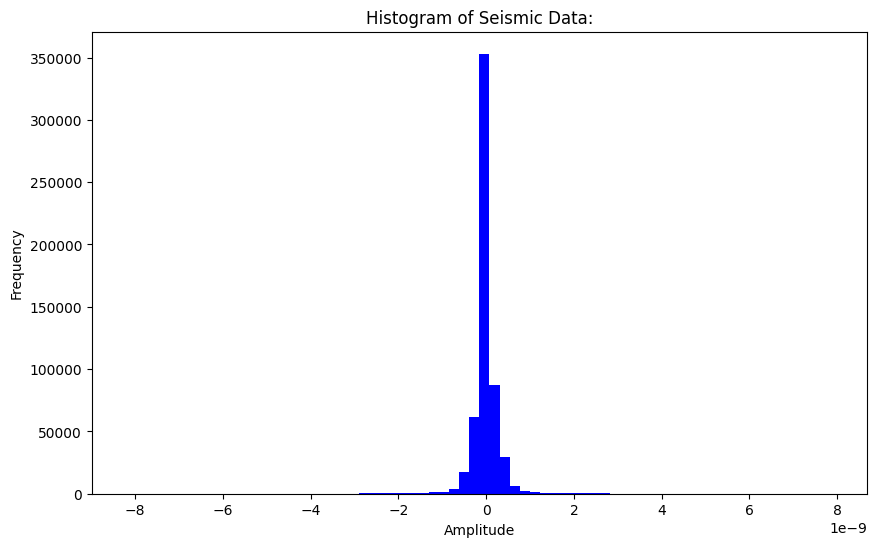

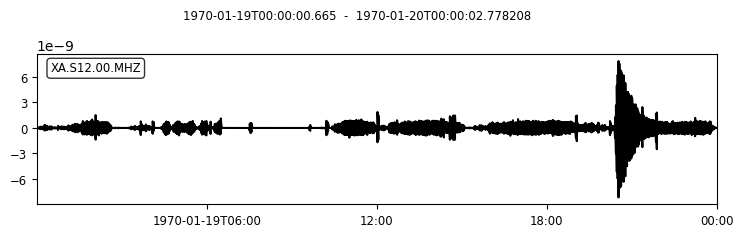

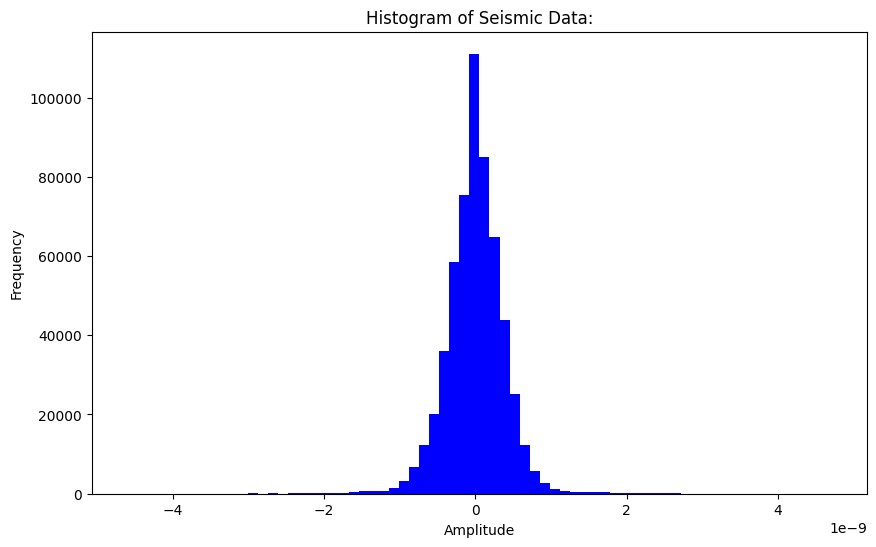

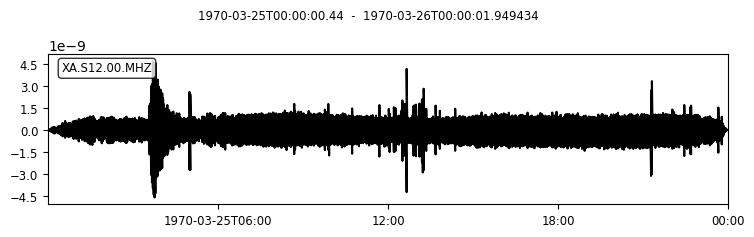

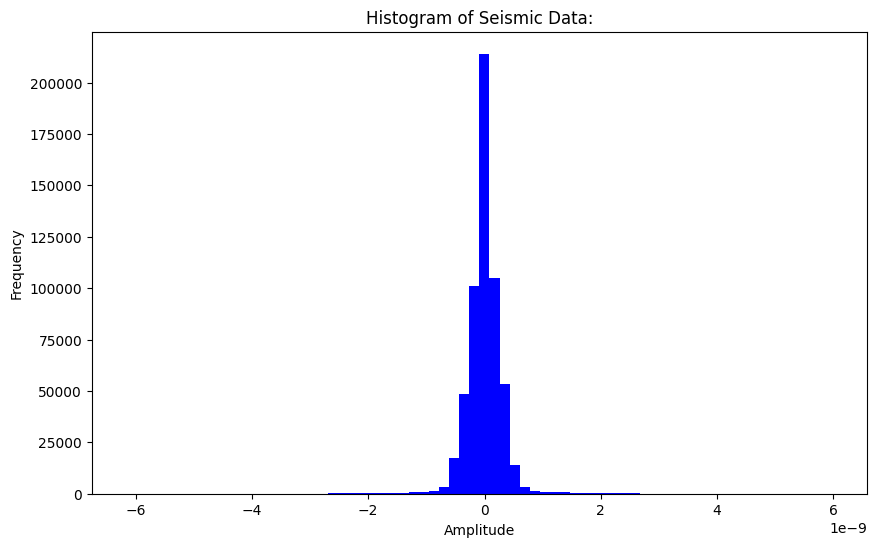

...

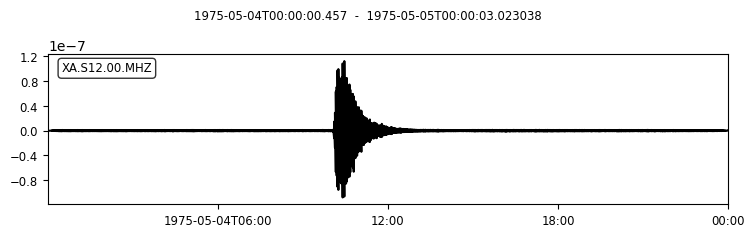

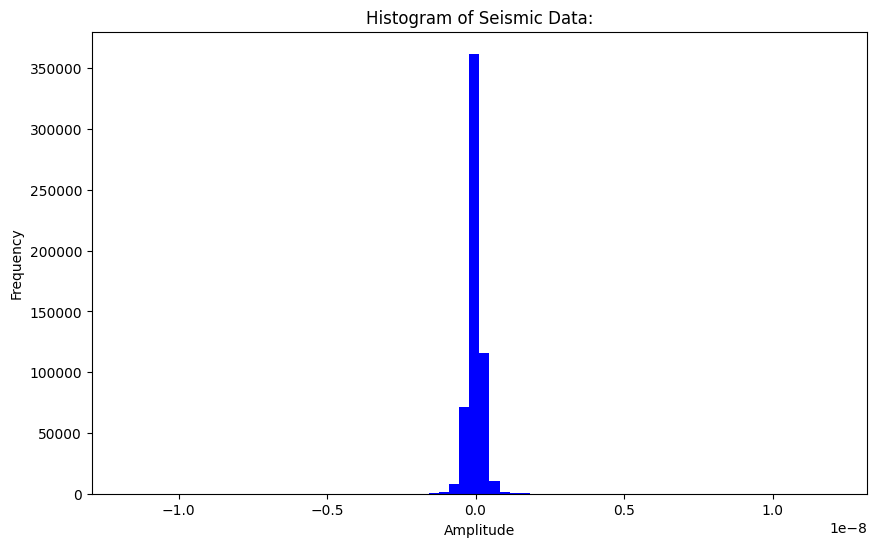

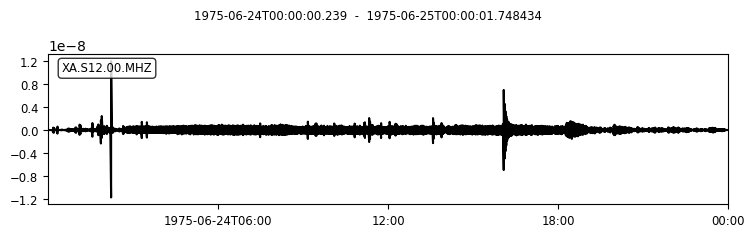

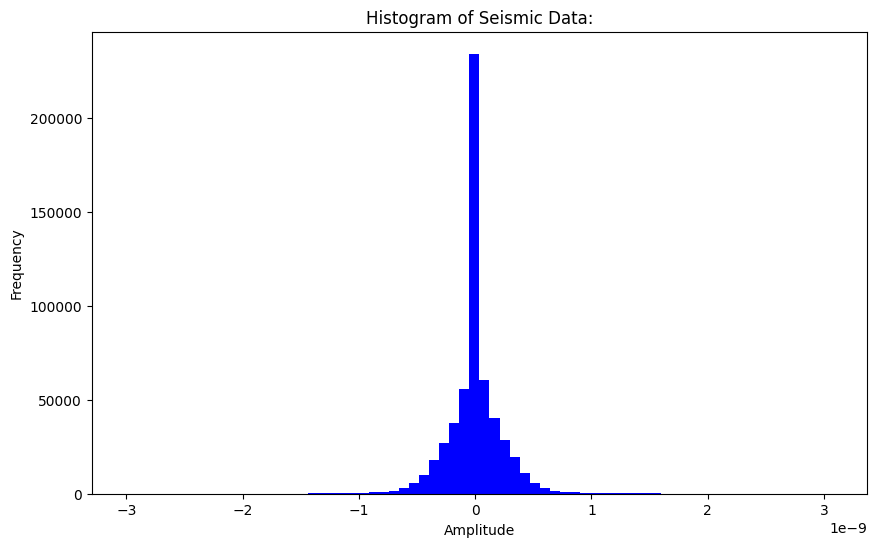

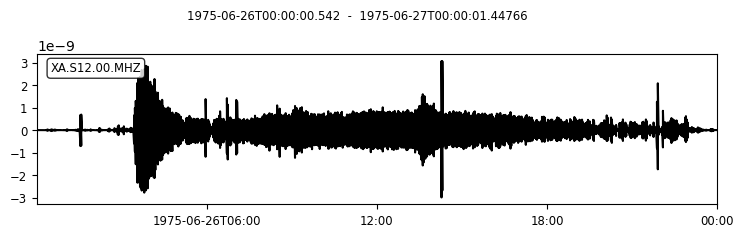

In [2]:
folder_path = 'data/data/lunar/training/data/S12_GradeA/'
csv_files = glob.glob(folder_path + '*.csv')
mseed_files = glob.glob(folder_path + '*.mseed')
csv_files = sorted(csv_files)
mseed_files = sorted(mseed_files)

# Read the CSV file (you can remove this if you don't need to use the CSV file anymore)
df_csv = pd.read_csv("data/data/lunar/training/data/S12_GradeA/xa.s12.00.mhz.1974-04-26HR00_evid00144.csv")

# Iterate through each .mseed file
for file in mseed_files:
    stream = obspy.read(file)

    amplitudes = []
    for trace in stream:
        amplitudes.extend(trace.data)

    plt.figure(figsize=(10, 6))
    plt.hist(amplitudes, bins=70, color='blue')

    # Set the title and labels for the plot
    plt.title(f"Histogram of Seismic Data:")
    plt.xlabel('Amplitude')
    plt.ylabel('Frequency')

    # Show the plot
    plt.show()

    # Optionally, you can also plot the .mseed data itself for visualization
    stream.plot()


In [3]:
# Create a pandas DataFrame from the list of file paths
mseed_files = pd.DataFrame(mseed_files, columns=['File Path'])
# Display the DataFrame
print(type(mseed_files))

<class 'pandas.core.frame.DataFrame'>


In [3]:
csv_files = pd.DataFrame(csv_files, columns=['File Path'])
# Display the DataFrame
print(type(csv_files))

<class 'pandas.core.frame.DataFrame'>


In [4]:
# Path to the folder containing CSV files
folder_path = 'data/data/lunar/training/data/S12_GradeA/'

# Get a list of all CSV files in the folder
csv_files = glob.glob(folder_path + '*.csv')

# Loop through each CSV file and calculate descriptive statistics
for file in csv_files:
    df_csv = pd.read_csv(file)  # Load the CSV file into a DataFrame
    
    # Rename 'time_abs(%Y-%m-%dT%H:%M:%S.%f)' column to 'time_abs' for convenience, if it exists
    if 'time_abs(%Y-%m-%dT%H:%M:%S.%f)' in df_csv.columns:
        df_csv.rename(columns={'time_abs(%Y-%m-%dT%H:%M:%S.%f)': 'time_abs'}, inplace=True)
    
    # Calculate descriptive statistics for 'velocity(m/s)'
    stats = df_csv['velocity(m/s)'].describe()
    velocity_range = df_csv['velocity(m/s)'].max() - df_csv['velocity(m/s)'].min()
    
    # Print the descriptive statistics for each file
    print(f"Descriptive Statistics for {file}:\n", stats)
    print(f"Range: {velocity_range}\n")

Descriptive Statistics for data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1970-01-19HR00_evid00002.csv:
 count    5.724150e+05
mean    -8.443134e-13
std      3.530059e-10
min     -8.185283e-09
25%     -5.504830e-11
50%     -1.633815e-17
75%      5.443508e-11
max      7.874026e-09
Name: velocity(m/s), dtype: float64
Range: 1.6059308421588253e-08

Descriptive Statistics for data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1970-03-25HR00_evid00003.csv:
 count    5.724110e+05
mean    -1.939339e-12
std      3.865140e-10
min     -4.603228e-09
25%     -2.115210e-10
50%      1.764188e-12
75%      2.144111e-10
max      4.707866e-09
Name: velocity(m/s), dtype: float64
Range: 9.311094910414378e-09

Descriptive Statistics for data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1970-03-26HR00_evid00004.csv:
 count    5.724110e+05
mean    -2.980386e-13
std      3.219585e-10
min     -6.144452e-09
25%     -1.356601e-10
50%      3.116433e-16
75%      1.395908e-10
max      5.969005e-09


In [3]:
cat = pd.read_csv(
    "data/data/lunar/training/catalogs/apollo12_catalog_GradeA_final.csv"
)
cat

,filename,time_abs(%Y-%m-%dT%H:%M:%S.%f),time_rel(sec),evid,mq_type
0,xa.s12.00.mhz.1970-01-19HR00_evid00002,1970-01-19T20:25:00.000000,73500.0,evid00002,impact_mq
1,xa.s12.00.mhz.1970-03-25HR00_evid00003,1970-03-25T03:32:00.000000,12720.0,evid00003,impact_mq
2,xa.s12.00.mhz.1970-03-26HR00_evid00004,1970-03-26T20:17:00.000000,73020.0,evid00004,impact_mq
3,xa.s12.00.mhz.1970-04-25HR00_evid00006,1970-04-25T01:14:00.000000,4440.0,evid00006,impact_mq
4,xa.s12.00.mhz.1970-04-26HR00_evid00007,1970-04-26T14:29:00.000000,52140.0,evid00007,deep_mq
...,...,...,...,...,...
71,xa.s12.00.mhz.1974-10-14HR00_evid00156,1974-10-14T17:43:00.000000,63780.0,evid00156,impact_mq
72,xa.s12.00.mhz.1975-04-12HR00_evid00191,1975-04-12T18:15:00.000000,65700.0,evid00191,impact_mq
73,xa.s12.00.mhz.1975-05-04HR00_evid00192,1975-05-04T10:05:00.000000,36300.0,evid00192,impact_mq
74,xa.s12.00.mhz.1975-06-24HR00_evid00196,1975-06-24T16:03:00.000000,57780.0,evid00196,impact_mq


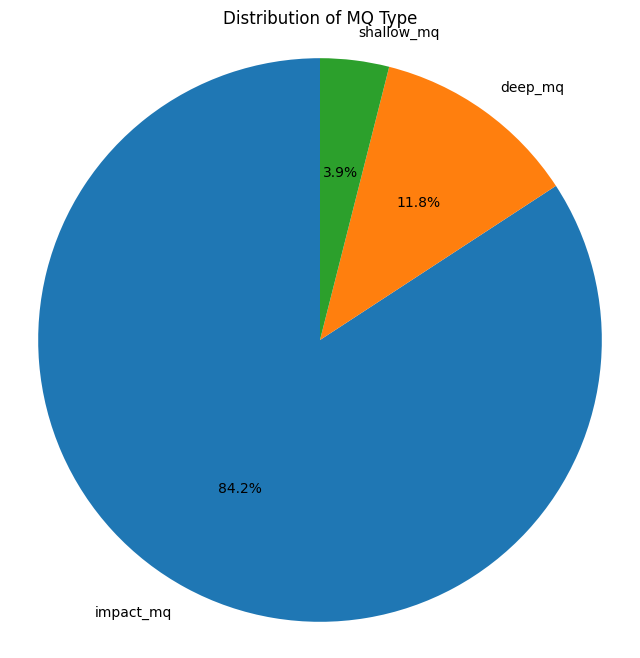

In [6]:
mq_counts = cat["mq_type"].value_counts()

# Plot the pie chart
plt.figure(figsize=(8, 8))
plt.pie(mq_counts, labels=mq_counts.index, autopct='%1.1f%%', startangle=90)
plt.title("Distribution of MQ Type")
plt.axis('equal')
plt.show()


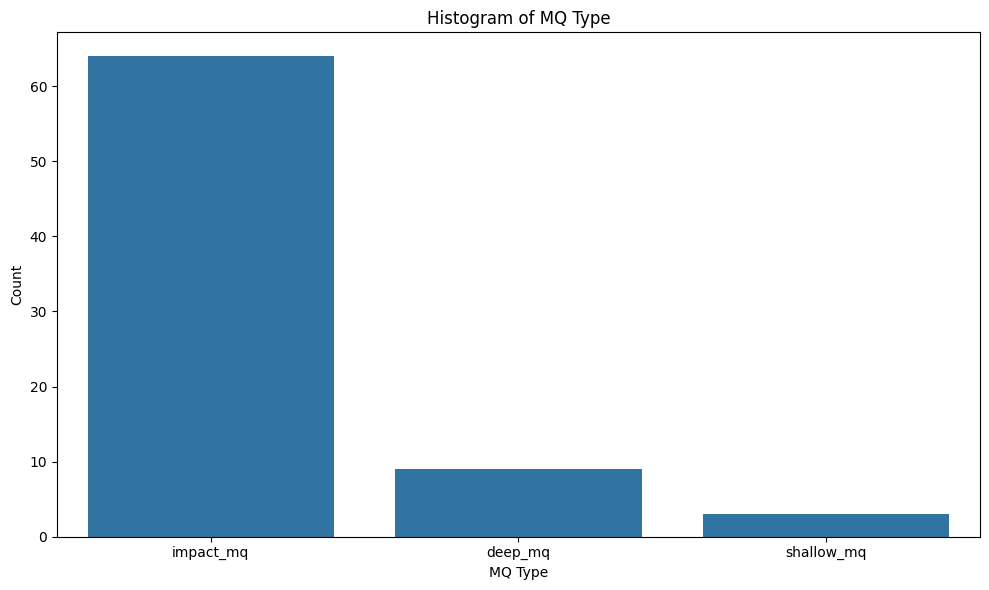

In [4]:
# Create a histogram for 'mq_type'
plt.figure(figsize=(10, 6))
sns.countplot(x='mq_type', data=cat)

# Set plot title and labels
plt.title("Histogram of MQ Type")
plt.xlabel("MQ Type")
plt.ylabel("Count")

# Show the plot
plt.tight_layout()
plt.show()


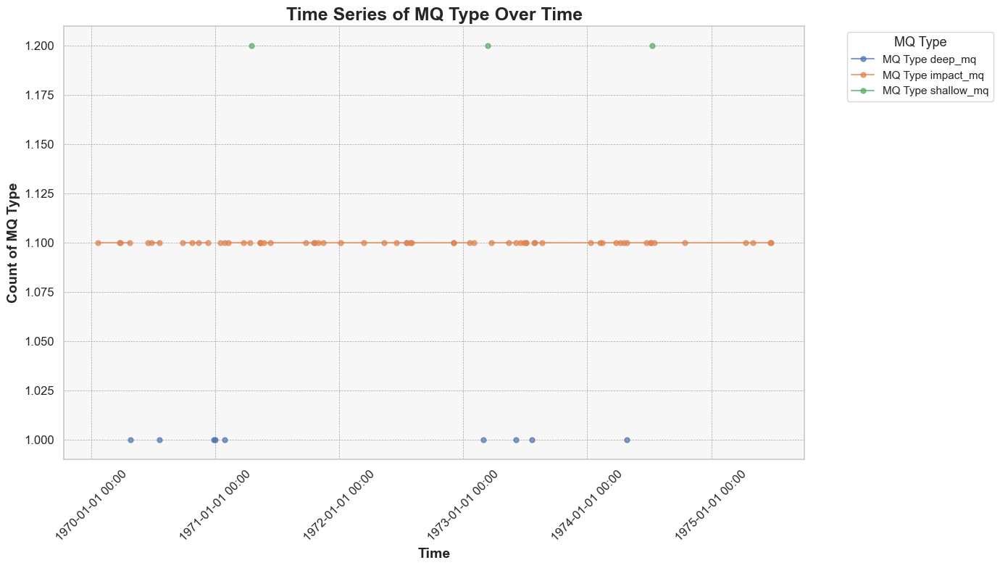

In [8]:
# Convert Polars DataFrame to Pandas DataFrame if it's not already Pandas
if isinstance(cat, pl.DataFrame):  # Check if cat is Polars
    cat_df = cat.to_pandas()
else:
    cat_df = cat  # Already a Pandas DataFrame

# Ensure 'time_abs' is in datetime format
cat_df['time_abs(%Y-%m-%dT%H:%M:%S.%f)'] = pd.to_datetime(cat_df['time_abs(%Y-%m-%dT%H:%M:%S.%f)'])

# Apply a small jitter to the count values to avoid overlap
cat_df['count_jittered'] = cat_df.groupby(['time_abs(%Y-%m-%dT%H:%M:%S.%f)', 'mq_type']).ngroup() + np.random.normal(0, 0.1, len(cat_df))

# Set style for seaborn and plot
sns.set(style="whitegrid")
plt.figure(figsize=(14, 8))

# Group by time and 'mq_type', plot with jittered values
counts_df = cat_df.groupby(['time_abs(%Y-%m-%dT%H:%M:%S.%f)', 'mq_type']).size().unstack()
for i, col in enumerate(counts_df.columns):
    # Apply a small y-offset to each line
    plt.plot(counts_df.index, counts_df[col] + (i * 0.1), label=f'MQ Type {col}', marker='o', markersize=5, alpha=0.7)

# Set plot title and labels
plt.title("Time Series of MQ Type Over Time", fontsize=18, weight='bold')
plt.xlabel("Time", fontsize=14, weight='bold')
plt.ylabel("Count of MQ Type", fontsize=14, weight='bold')

# Set x-axis format for dates
plt.gca().xaxis.set_major_formatter(DateFormatter("%Y-%m-%d %H:%M"))
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)

# Customize legend position and font
plt.legend(title="MQ Type", bbox_to_anchor=(1.05, 1), loc='upper left', title_fontsize=13, fontsize=11)

# Add grid and background color
plt.grid(color='gray', linestyle='--', linewidth=0.5, alpha=0.7)
plt.gca().set_facecolor('#f7f7f7')

# Show the plot
plt.tight_layout()
plt.show()

In [ ]:
for file in mseed_files:
    # Read the file as an ObsPy Stream object
    stream = obspy.read(file)
    print(f"Processing file: {file}\n")
    
    # Loop through each trace in the stream
    for tr in stream:
        print(f"Trace Stats - ID: {tr.id}")
        print(f"Mean Amplitude: {tr.data.mean()}")
        print(f"Standard Deviation: {tr.data.std()}")
        print(f"Max Amplitude: {tr.data.max()}")
        print(f"Min Amplitude: {tr.data.min()}")
        
        # Calculate trace duration in hours
        trace_duration_hours = (tr.stats.npts / tr.stats.sampling_rate) / 3600
        print(f"Trace Duration (hours): {trace_duration_hours:.2f}")
        print("-" * 40)  # Separator between traces for clarity

FileNotFoundError: [Errno 2] No such file or directory: 'File Path'

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1970-01-19HR00_evid00002.mseed


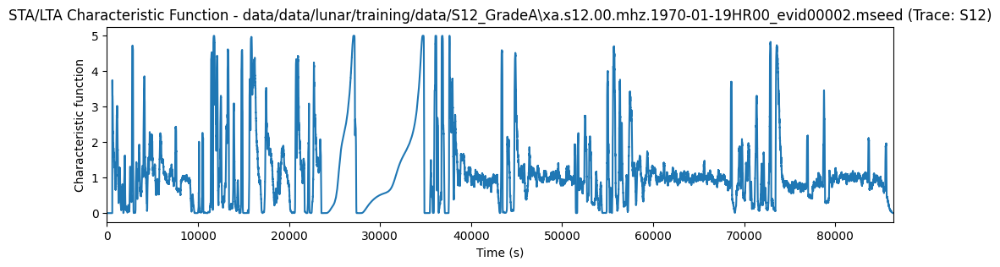

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1970-03-25HR00_evid00003.mseed


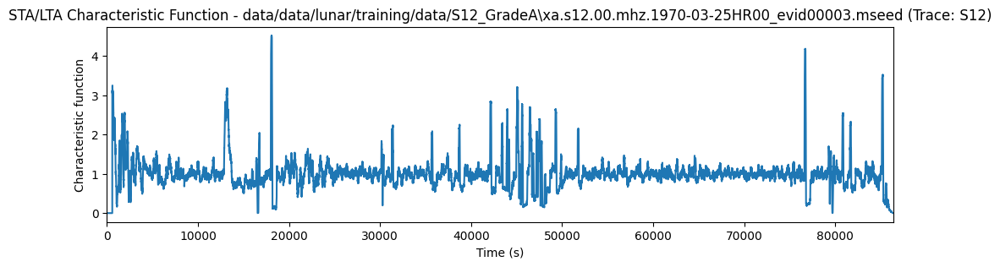

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1970-03-26HR00_evid00004.mseed


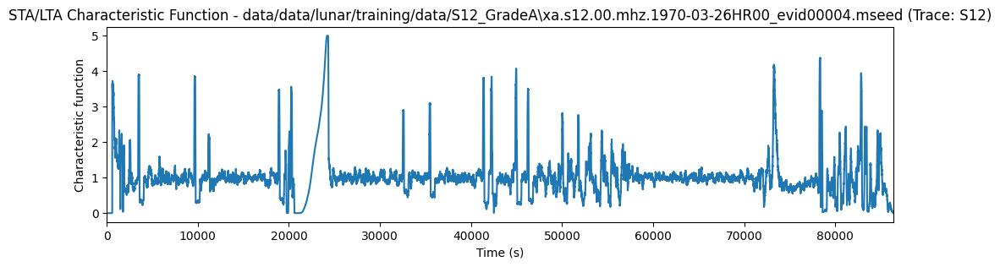

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1970-04-25HR00_evid00006.mseed


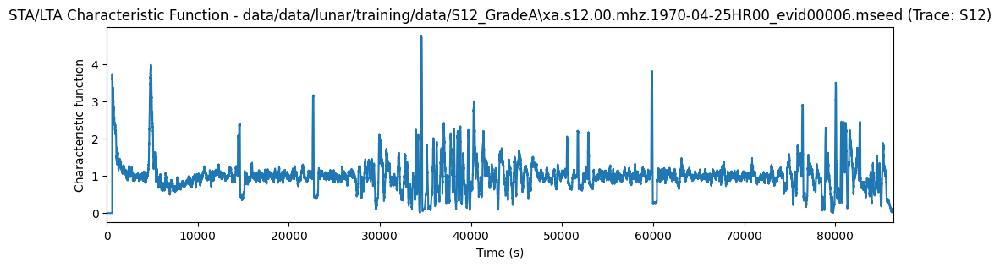

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1970-04-26HR00_evid00007.mseed


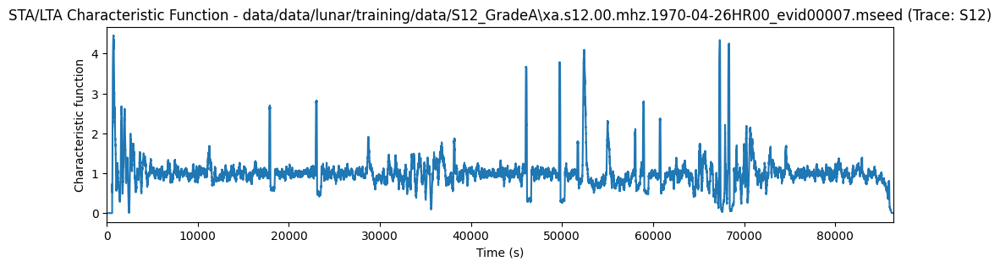

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1970-06-15HR00_evid00008.mseed


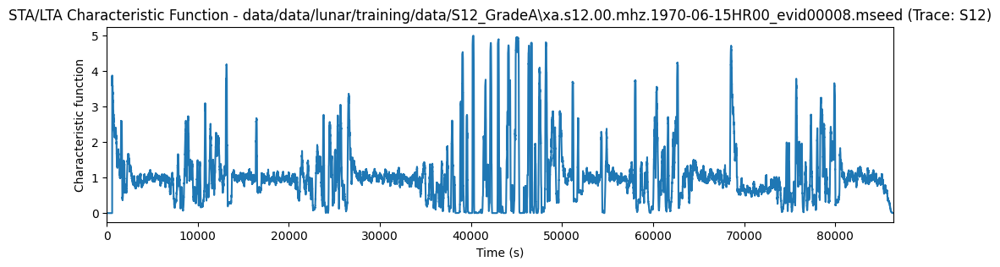

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1970-06-26HR00_evid00009.mseed


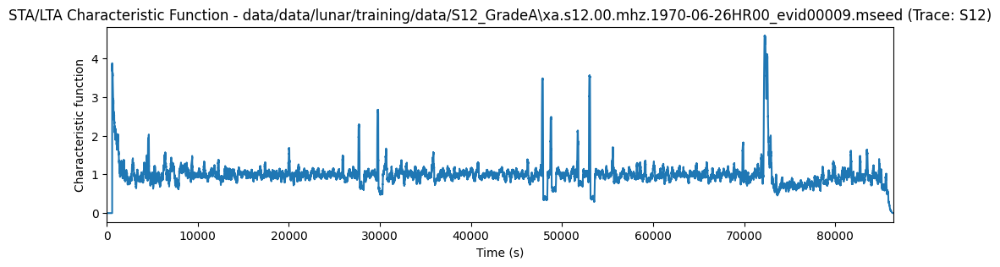

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1970-07-20HR00_evid00010.mseed


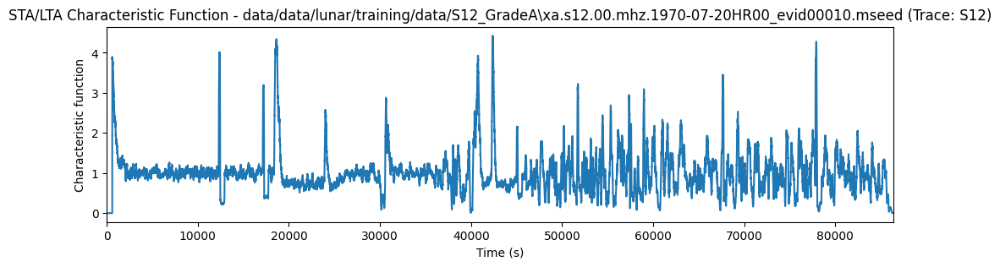

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1970-07-20HR00_evid00011.mseed


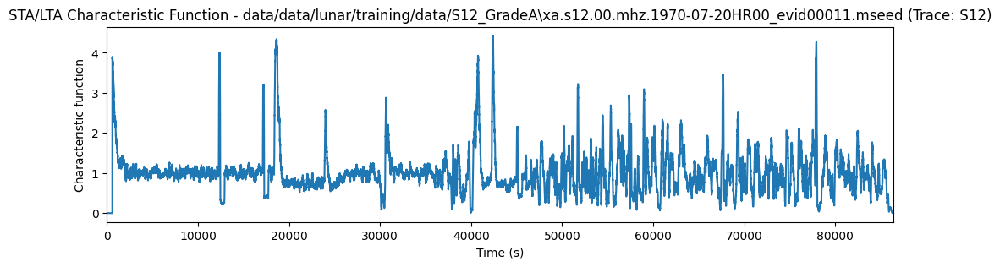

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1970-09-26HR00_evid00013.mseed


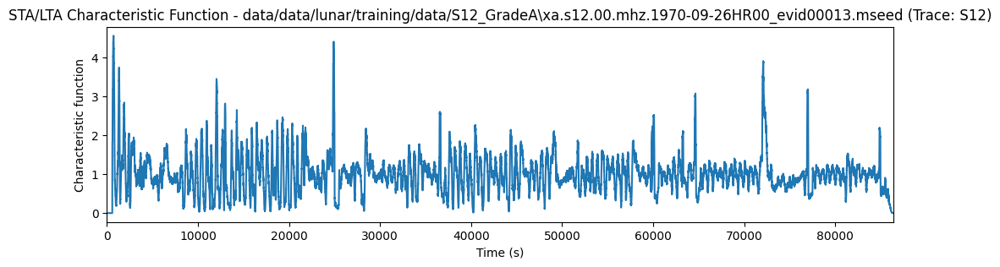

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1970-10-24HR00_evid00014.mseed


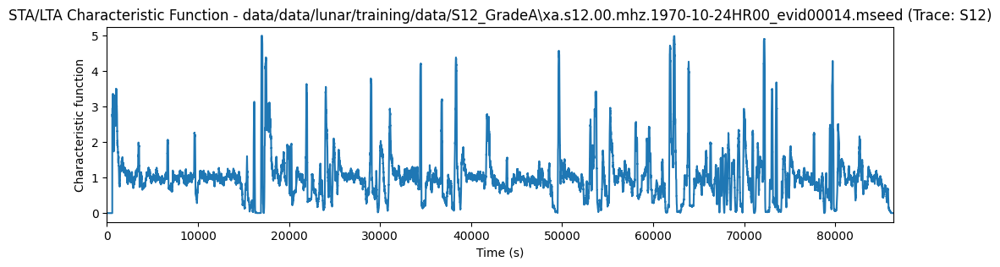

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1970-11-12HR00_evid00015.mseed


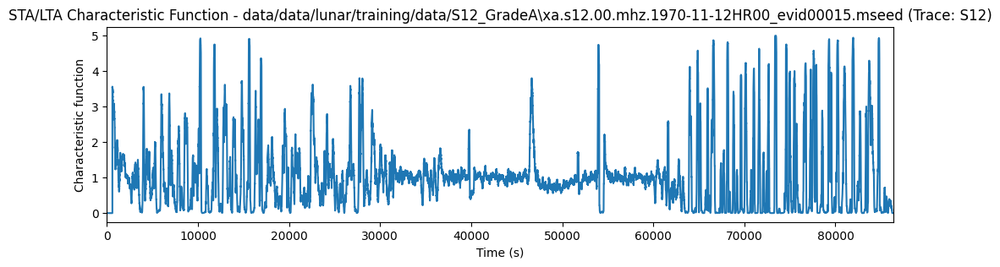

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1970-12-11HR00_evid00017.mseed


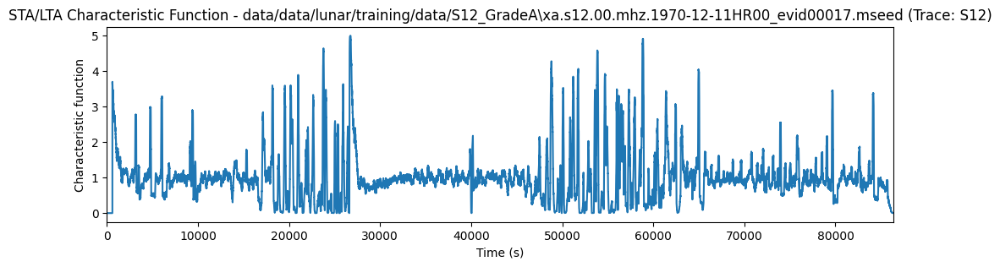

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1970-12-27HR00_evid00019.mseed


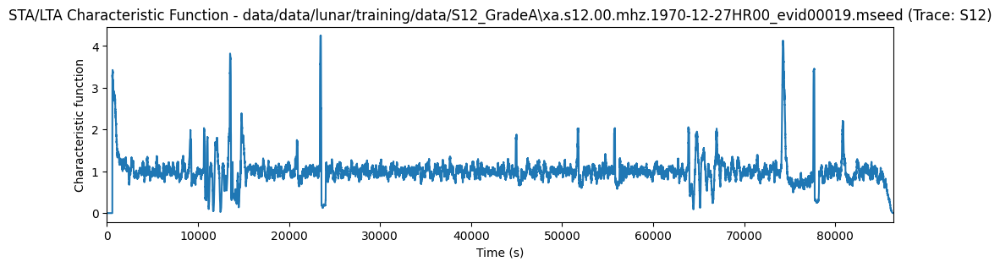

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1970-12-31HR00_evid00021.mseed


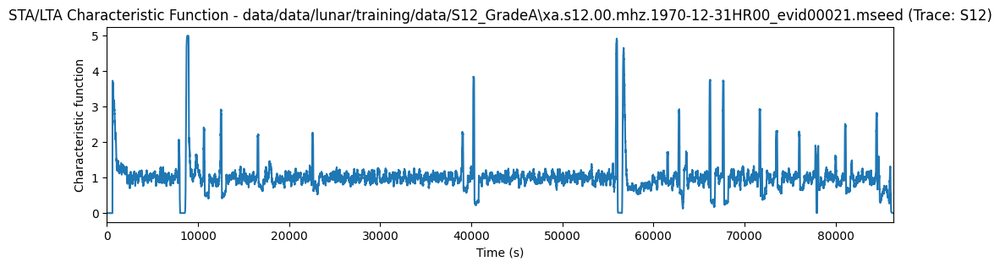

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1971-01-15HR00_evid00022.mseed


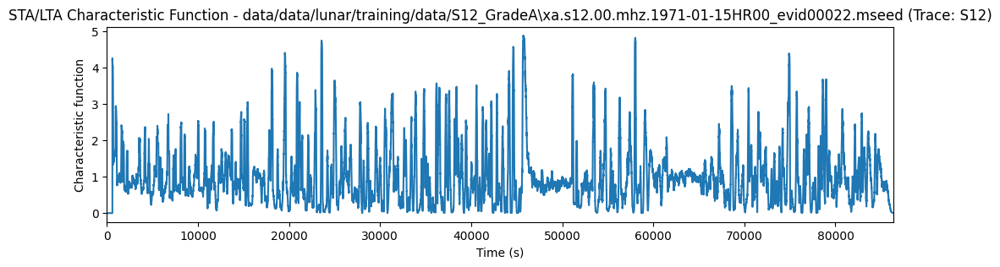

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1971-01-28HR00_evid00023.mseed


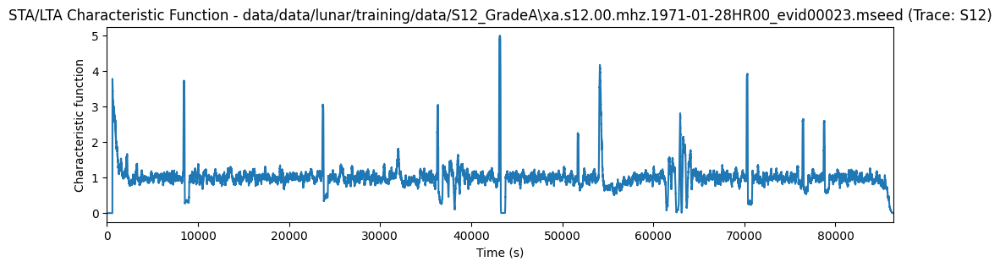

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1971-01-29HR00_evid00024.mseed


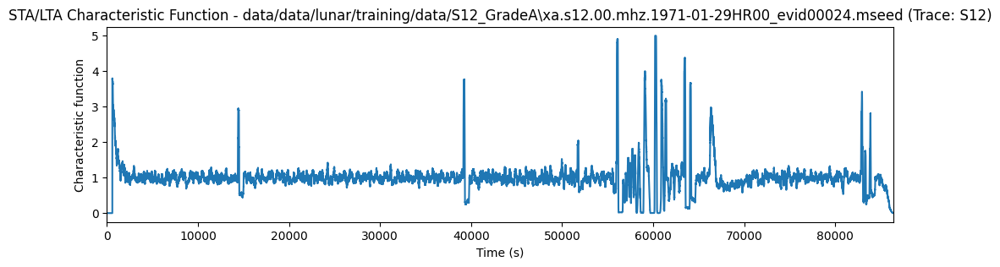

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1971-02-09HR00_evid00026.mseed


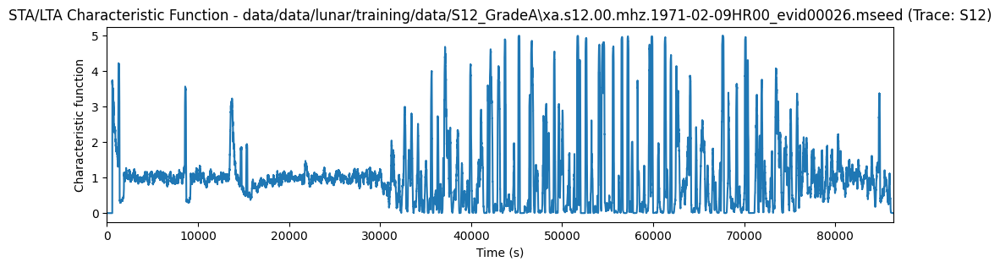

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1971-03-25HR00_evid00028.mseed


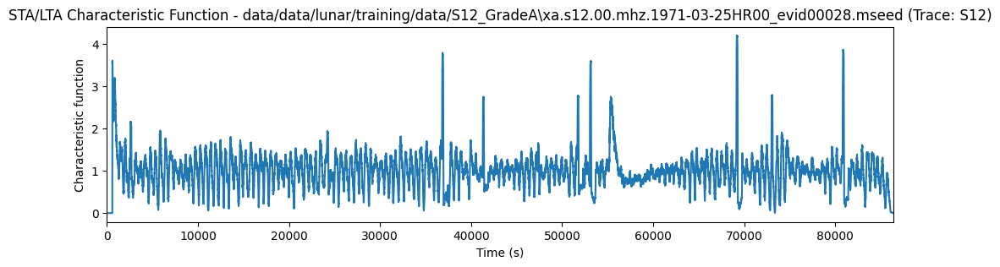

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1971-04-13HR02_evid00029.mseed


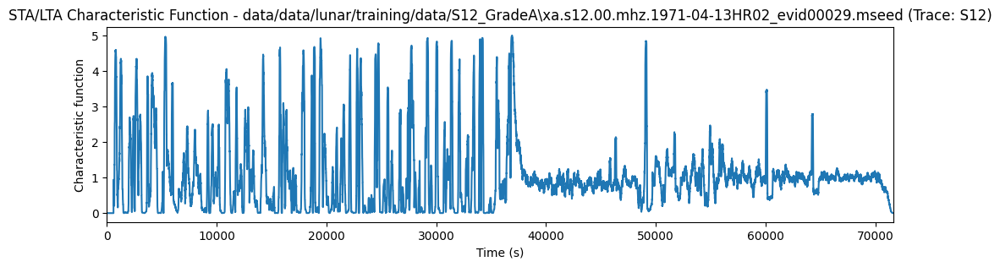

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1971-04-17HR00_evid00030.mseed


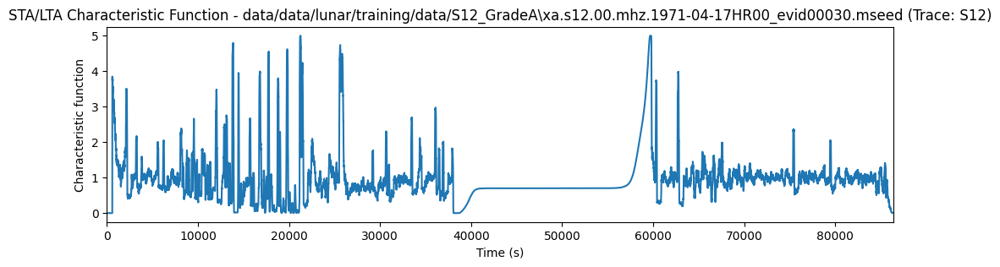

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1971-05-12HR00_evid00031.mseed


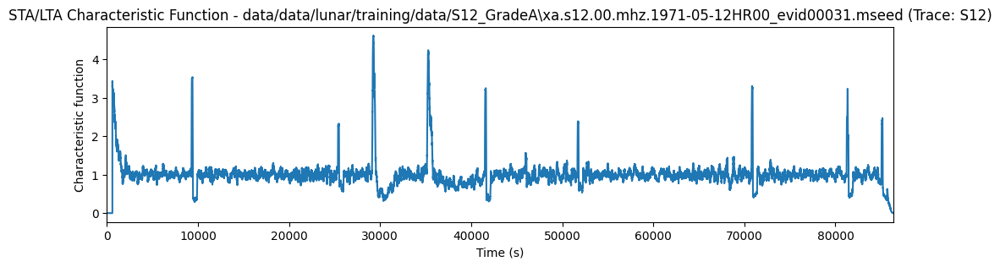

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1971-05-12HR00_evid00032.mseed


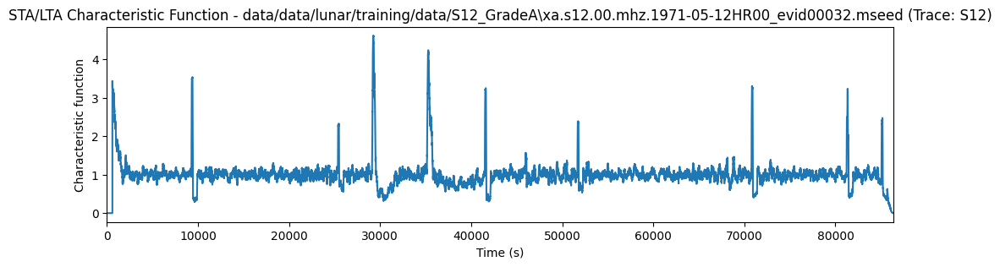

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1971-05-13HR00_evid00033.mseed


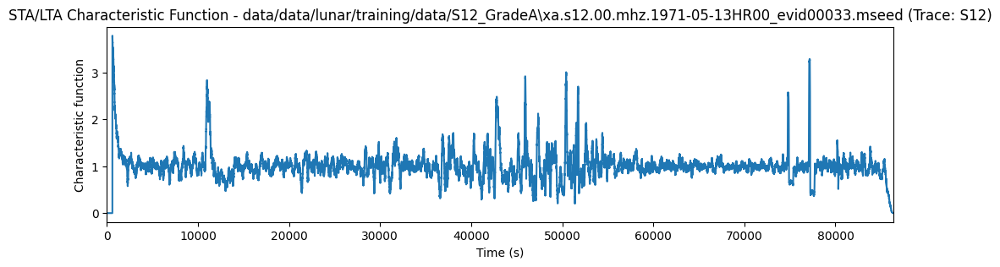

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1971-05-23HR00_evid00034.mseed


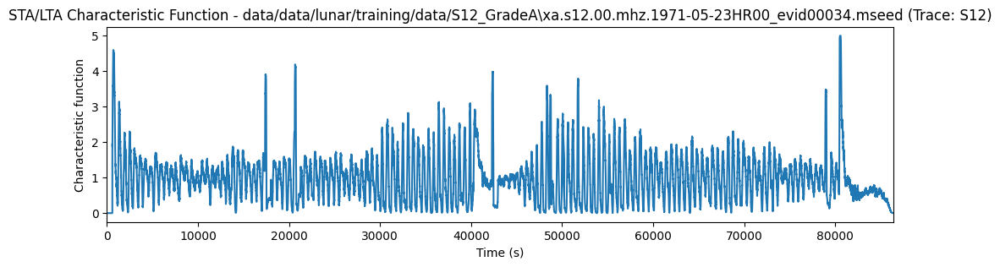

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1971-06-12HR00_evid00035.mseed


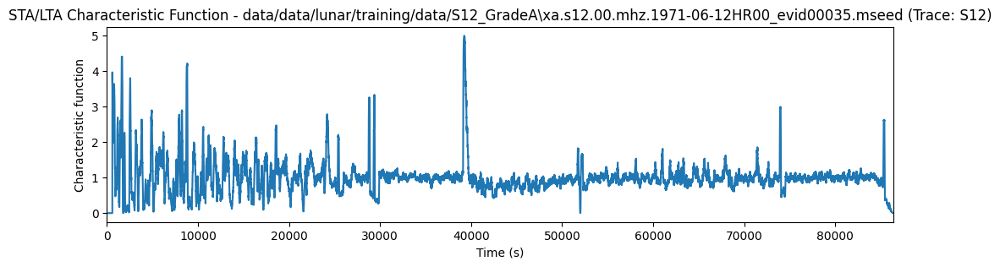

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1971-09-25HR00_evid00042.mseed


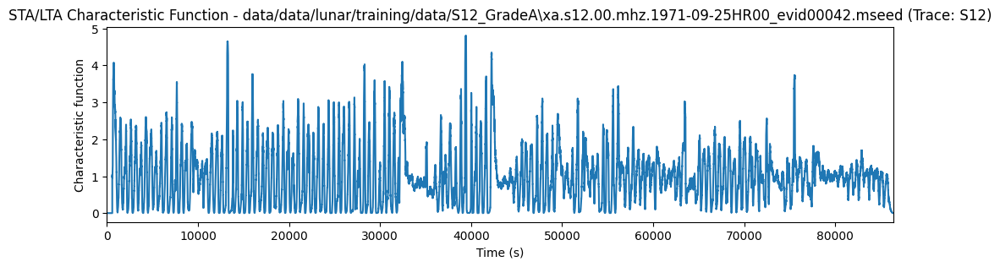

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1971-10-18HR00_evid00043.mseed


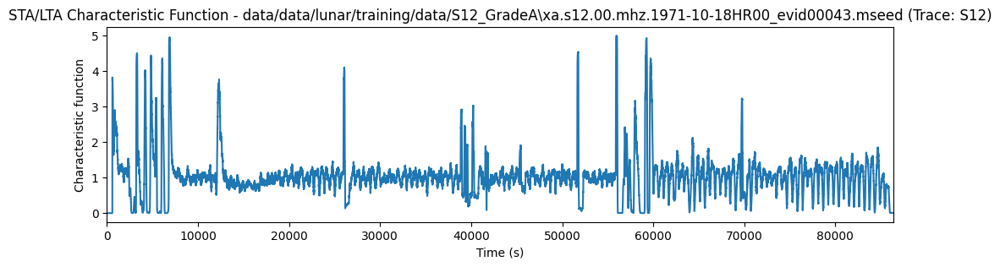

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1971-10-20HR00_evid00044.mseed


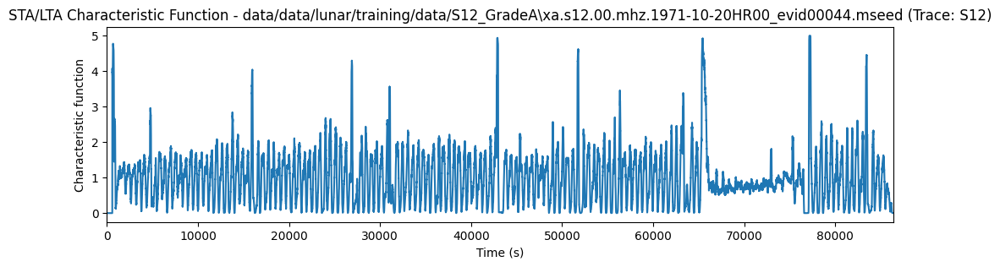

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1971-10-31HR00_evid00045.mseed


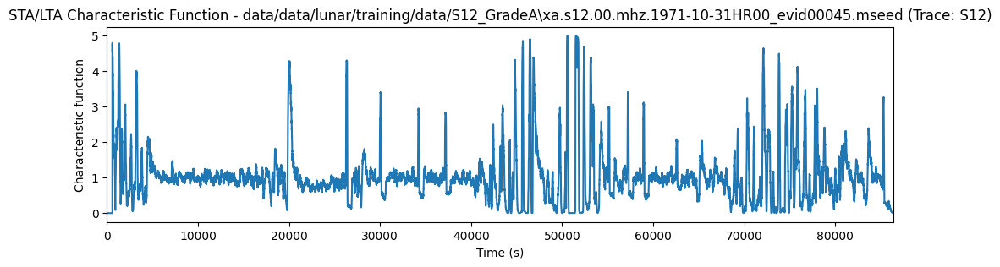

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1971-11-14HR00_evid00046.mseed


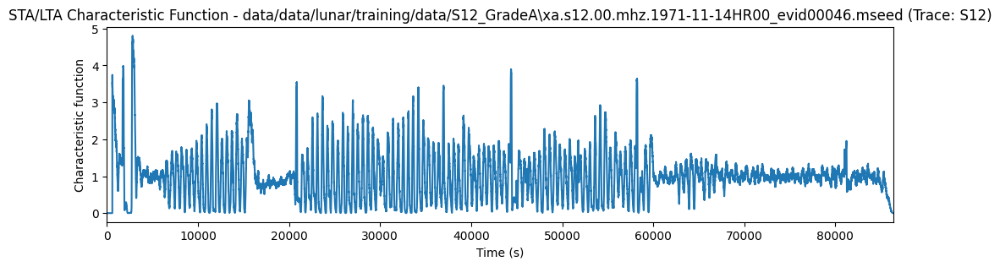

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1972-01-04HR00_evid00049.mseed


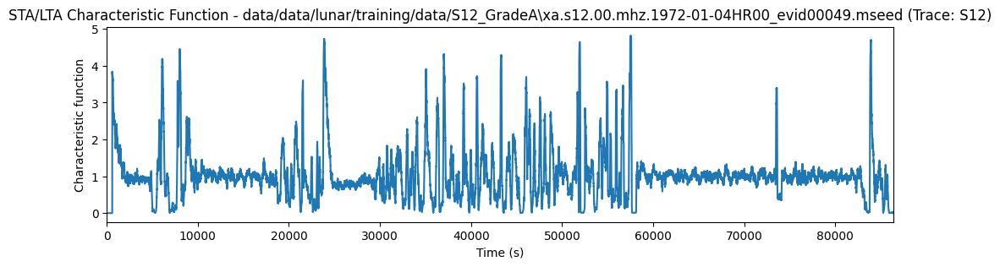

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1972-03-12HR00_evid00052.mseed


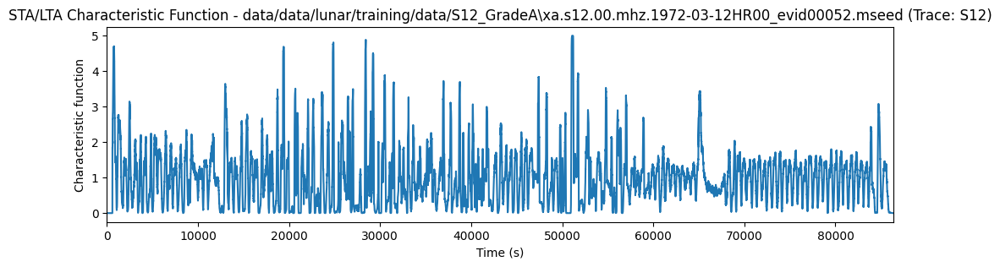

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1972-05-11HR00_evid00055.mseed


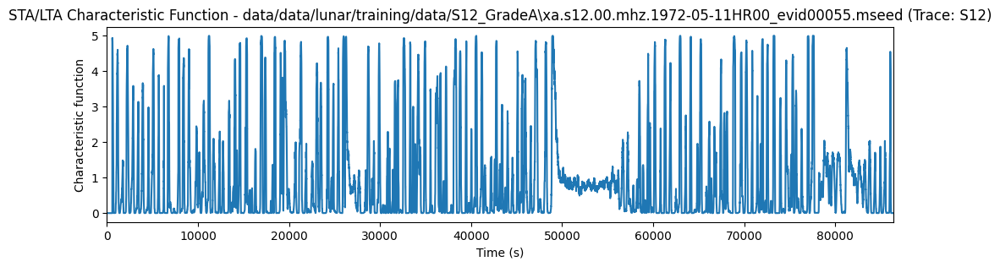

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1972-06-16HR00_evid00060.mseed


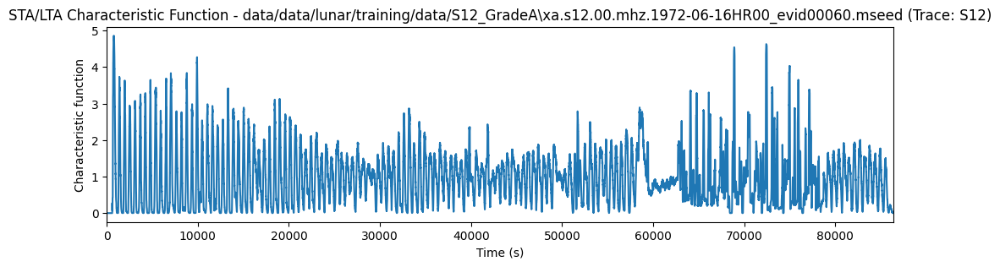

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1972-07-17HR00_evid00067.mseed


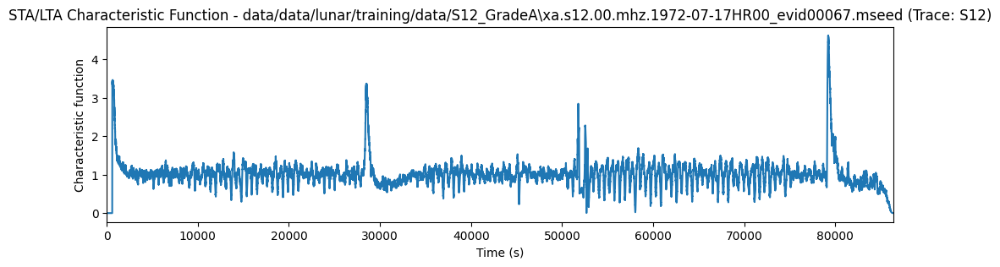

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1972-07-17HR00_evid00068.mseed


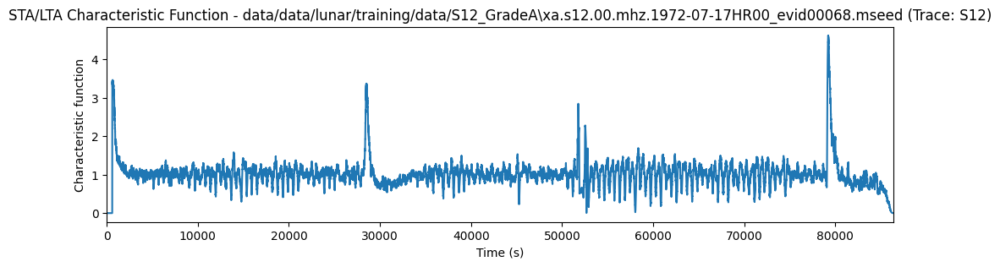

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1972-07-28HR00_evid00070.mseed


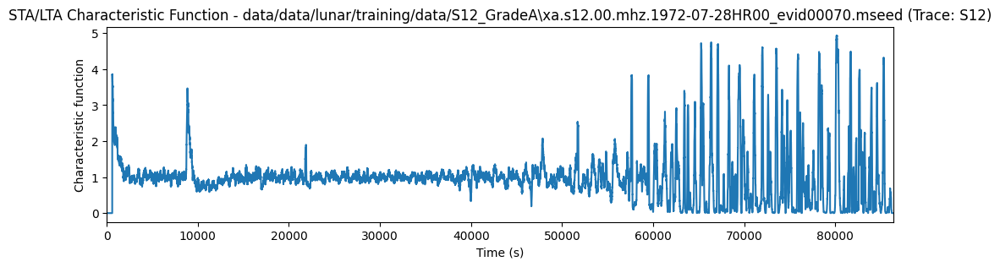

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1972-07-31HR00_evid00071.mseed


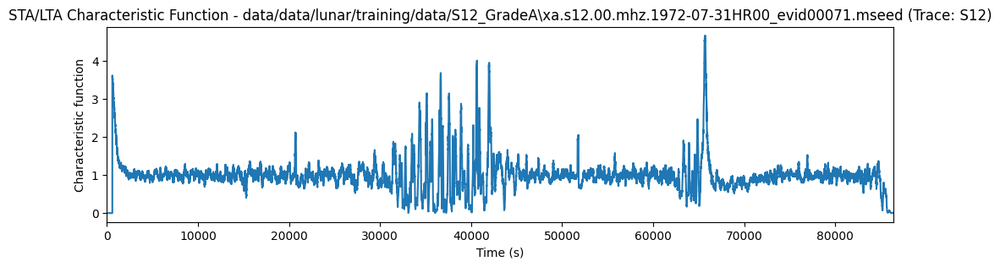

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1972-12-02HR00_evid00083.mseed


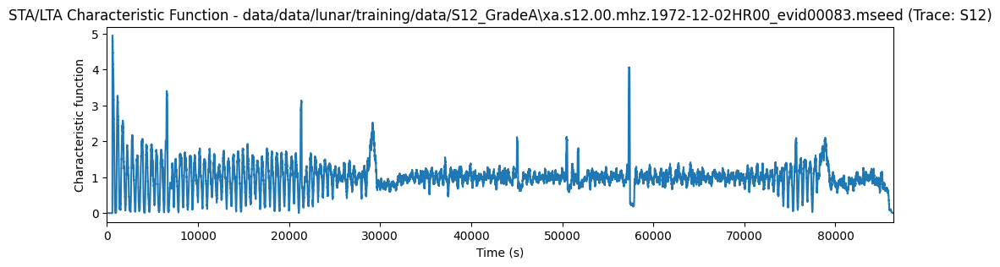

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1972-12-03HR00_evid00084.mseed


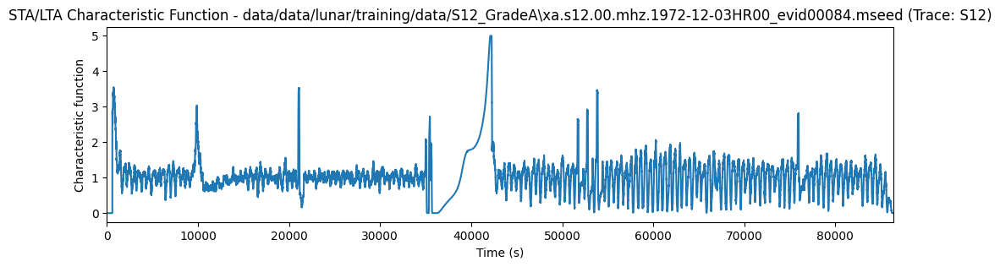

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1973-01-18HR00_evid00088.mseed


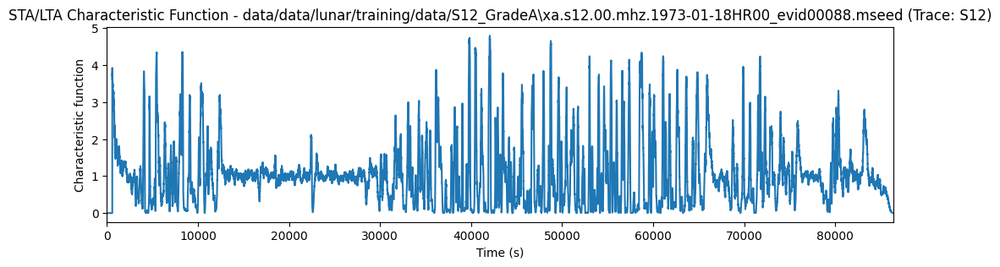

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1973-01-31HR00_evid00091.mseed


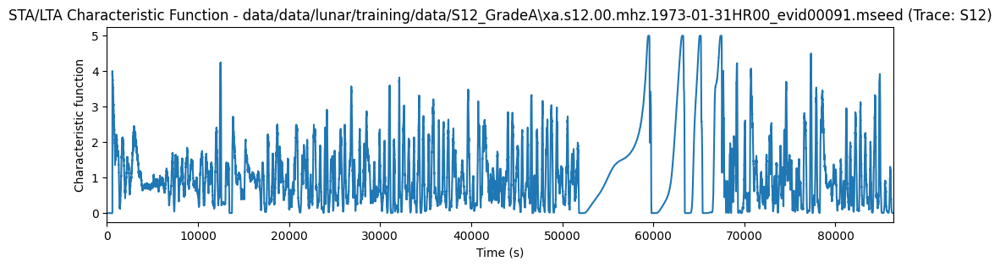

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1973-03-01HR00_evid00093.mseed


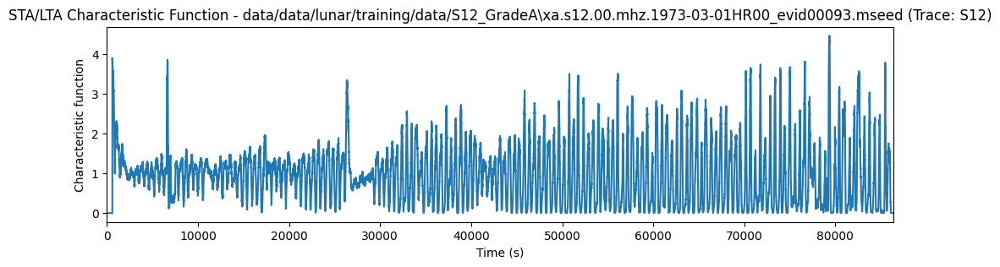

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1973-03-13HR00_evid00094.mseed


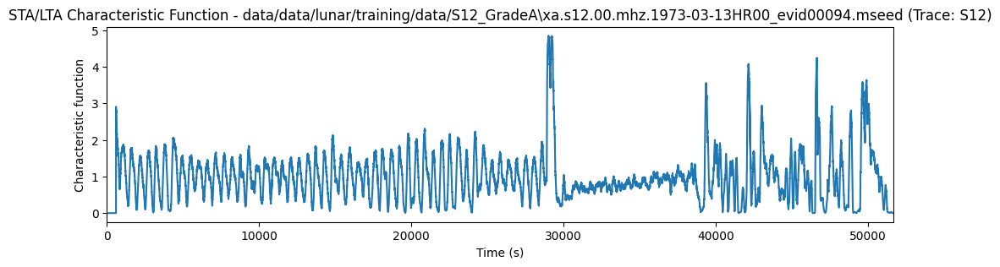

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1973-03-24HR00_evid00097.mseed


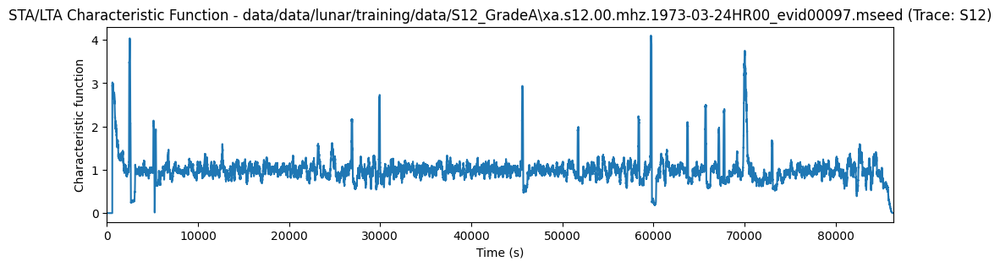

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1973-05-14HR00_evid00104.mseed


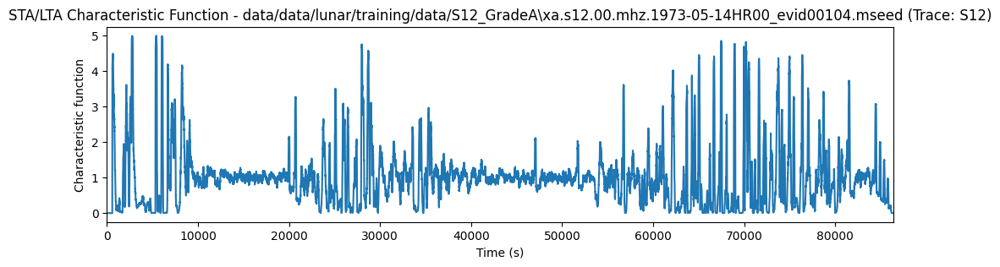

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1973-06-05HR00_evid00107.mseed


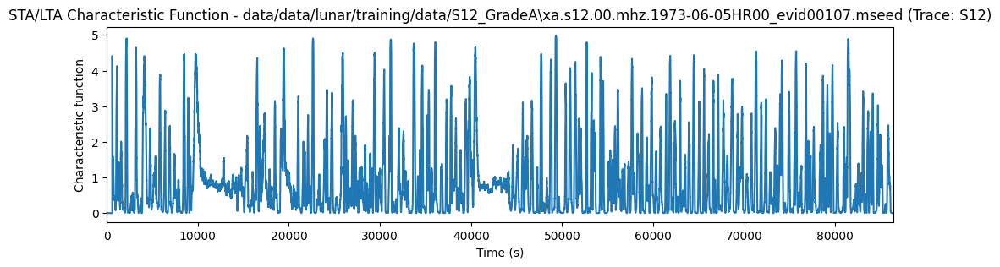

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1973-06-05HR00_evid00108.mseed


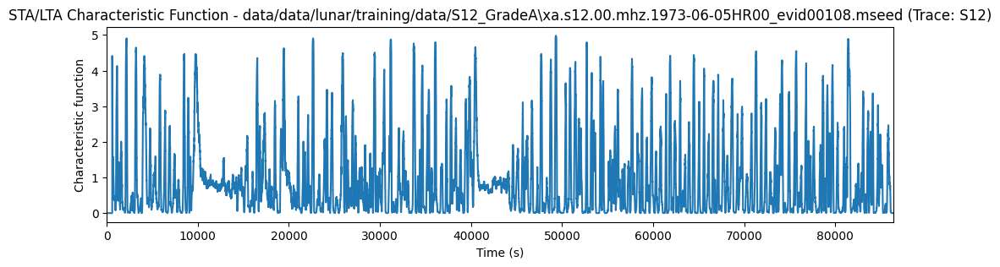

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1973-06-18HR00_evid00109.mseed


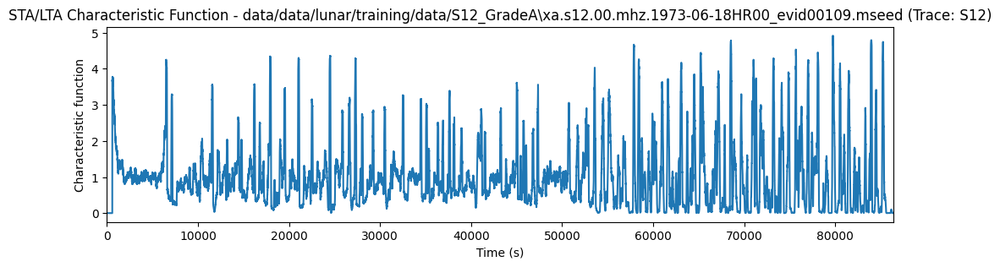

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1973-06-27HR00_evid00112.mseed


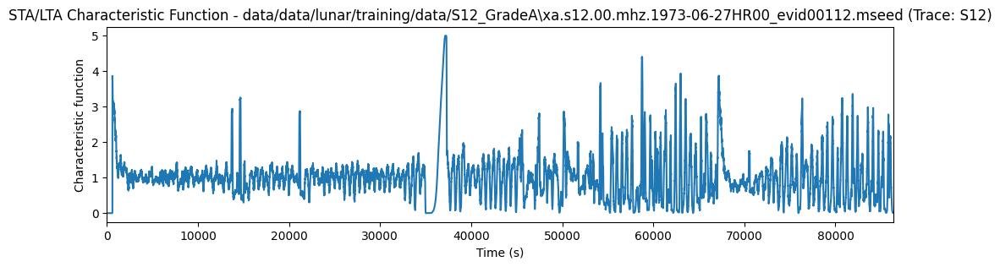

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1973-07-03HR00_evid00113.mseed


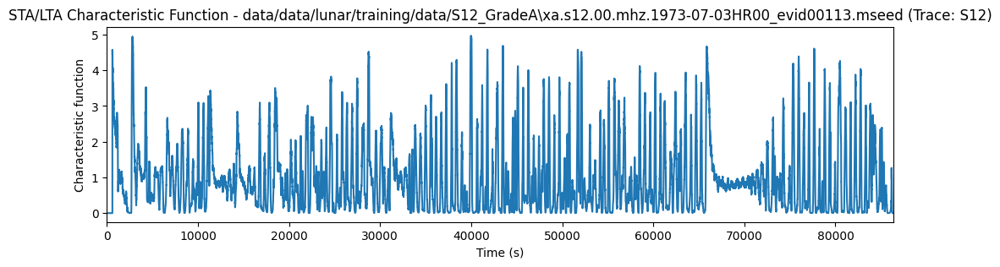

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1973-07-04HR00_evid00114.mseed


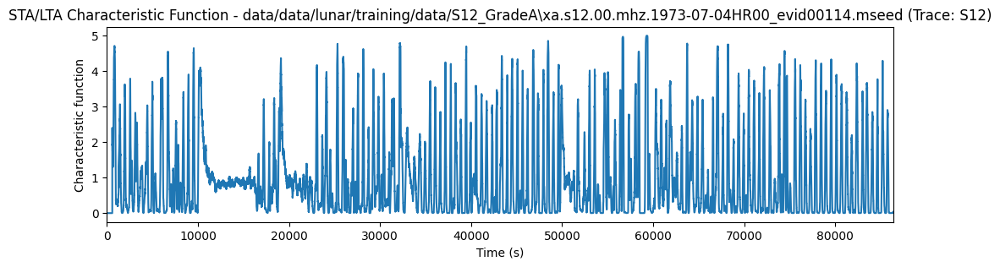

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1973-07-20HR00_evid00117.mseed


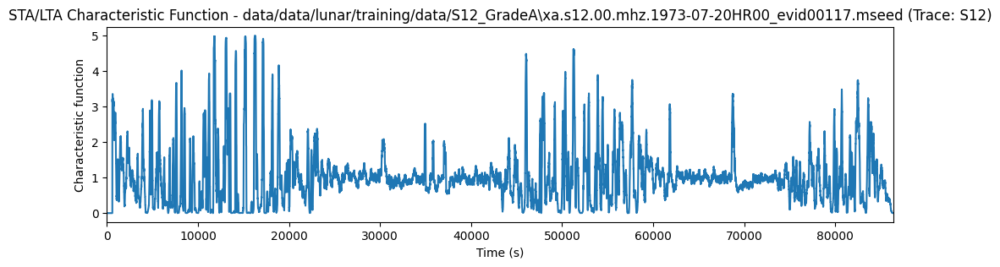

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1973-07-28HR00_evid00120.mseed


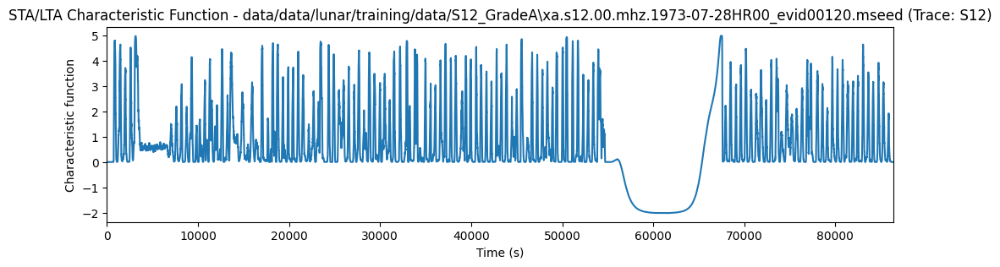

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1973-07-29HR00_evid00121.mseed


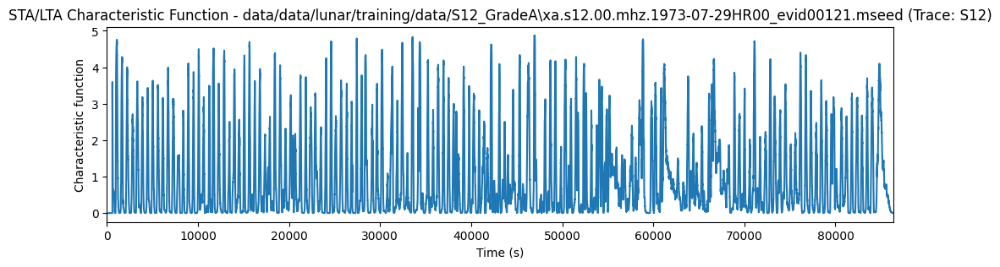

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1973-08-21HR00_evid00127.mseed


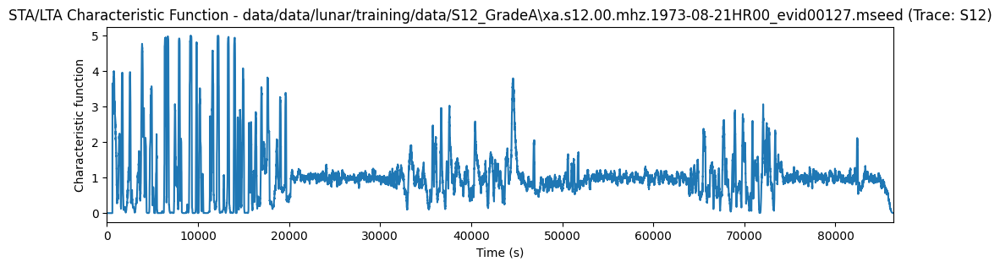

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1974-01-10HR00_evid00136.mseed


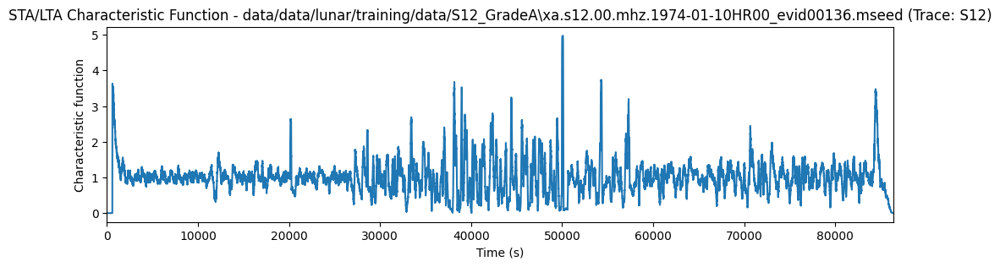

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1974-02-07HR00_evid00137.mseed


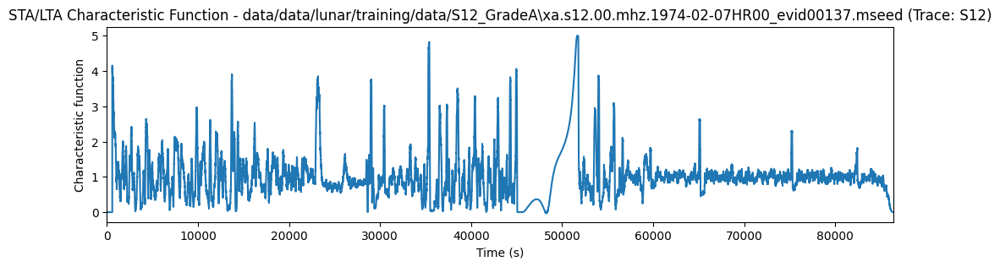

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1974-02-12HR00_evid00138.mseed


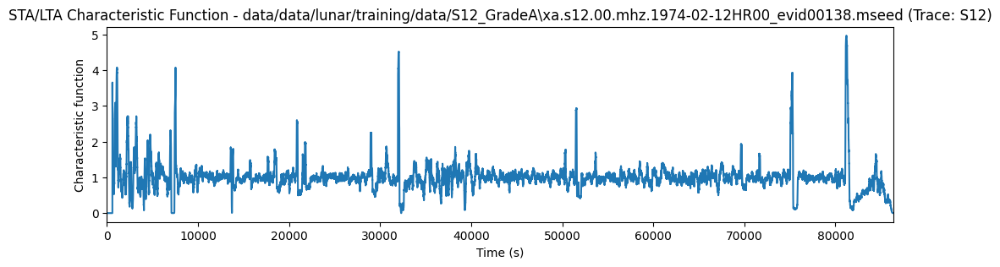

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1974-03-25HR00_evid00140.mseed


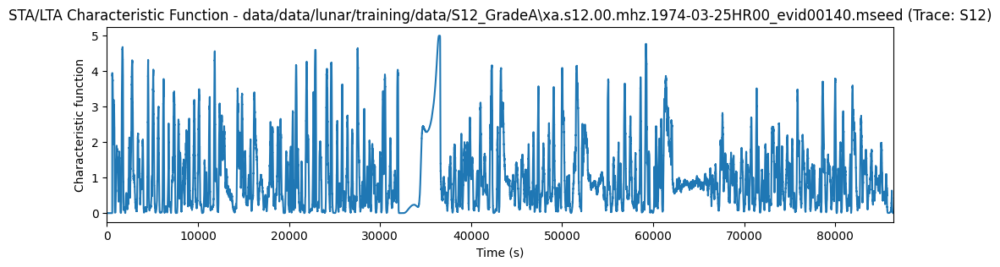

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1974-04-08HR00_evid00141.mseed


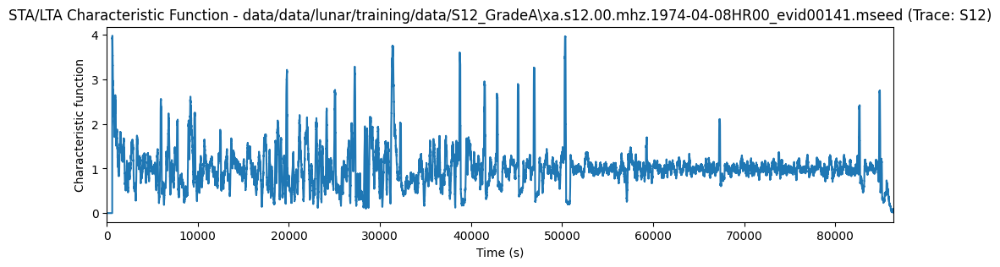

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1974-04-19HR00_evid00142.mseed


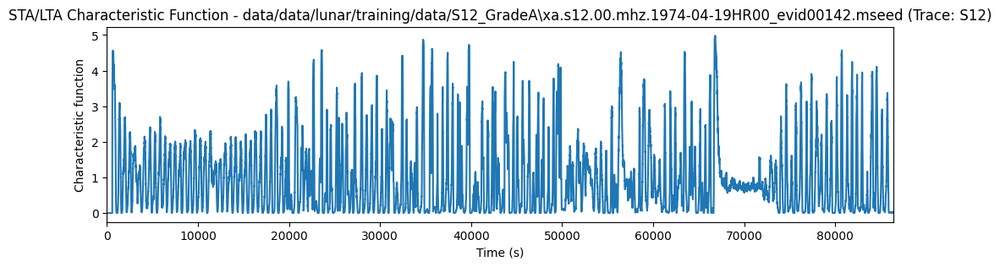

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1974-04-26HR00_evid00144.mseed


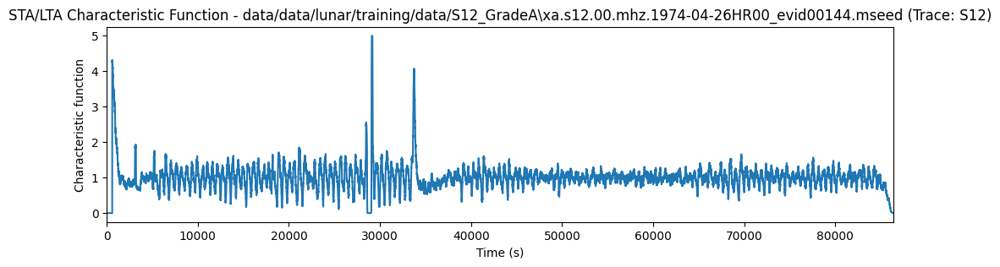

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1974-04-27HR00_evid00145.mseed


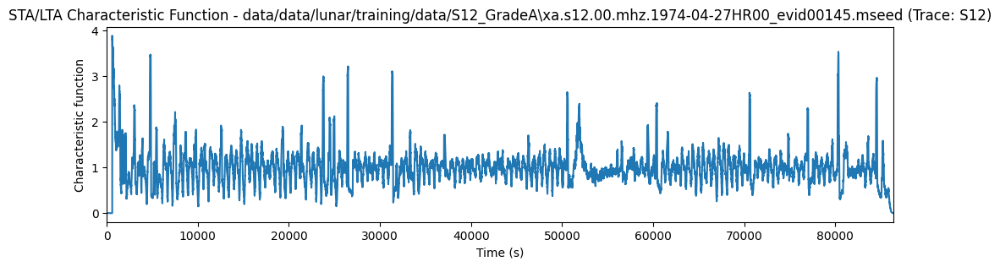

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1974-06-25HR00_evid00149.mseed


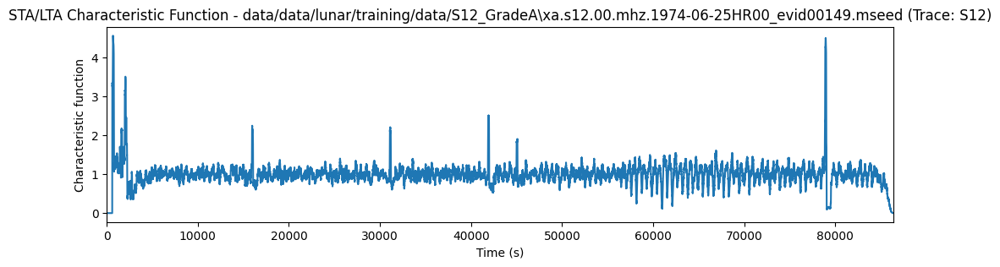

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1974-07-06HR00_evid00150.mseed


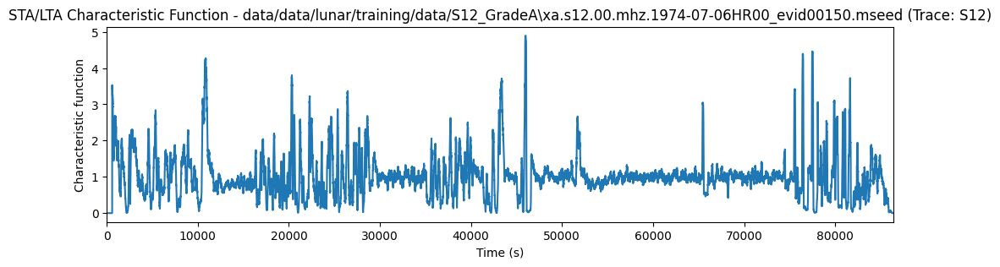

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1974-07-06HR00_evid00151.mseed


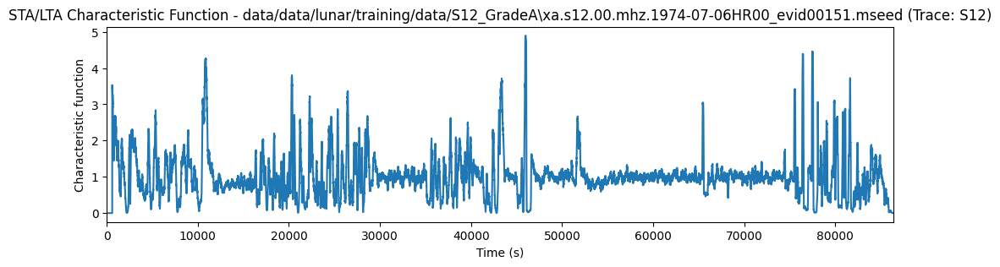

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1974-07-11HR00_evid00152.mseed


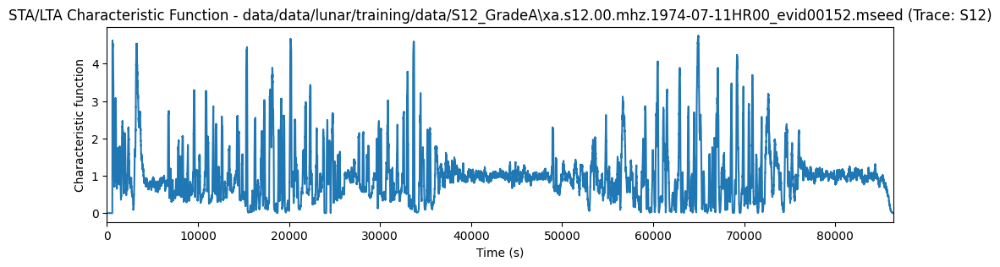

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1974-07-17HR00_evid00153.mseed


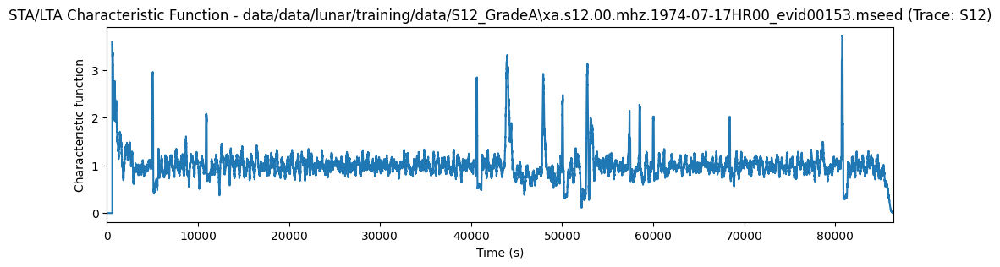

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1974-10-14HR00_evid00156.mseed


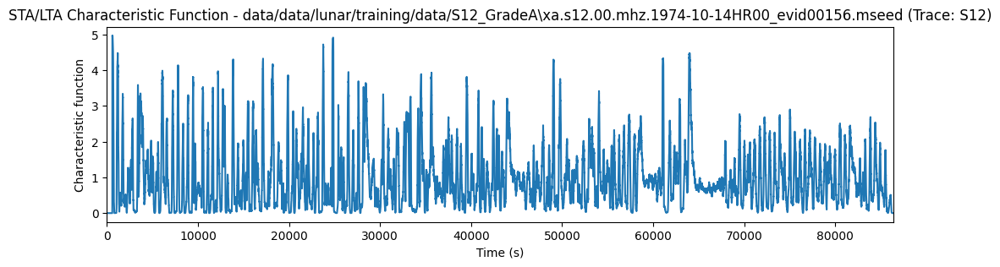

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1975-04-12HR00_evid00191.mseed


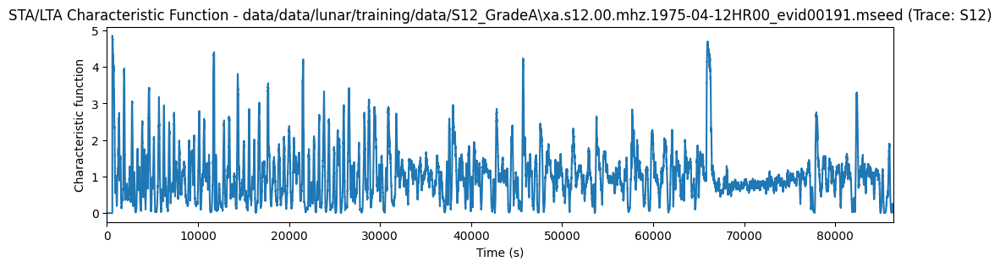

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1975-05-04HR00_evid00192.mseed


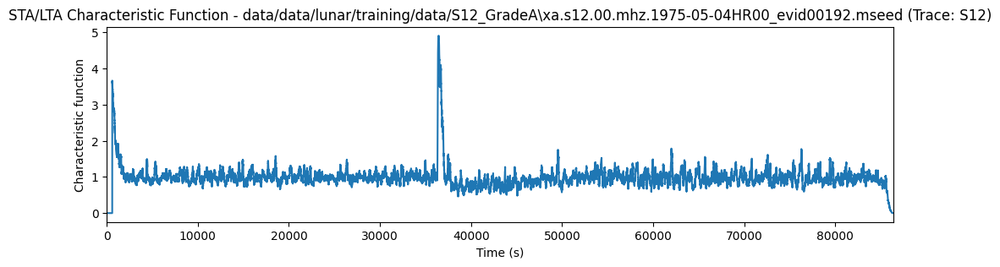

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1975-06-24HR00_evid00196.mseed


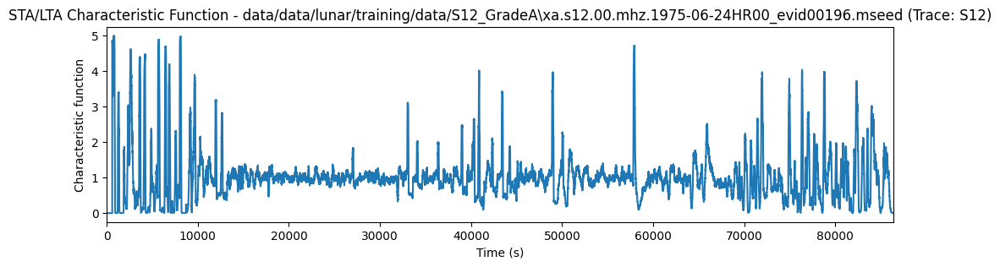

Processing file: data/data/lunar/training/data/S12_GradeA\xa.s12.00.mhz.1975-06-26HR00_evid00198.mseed


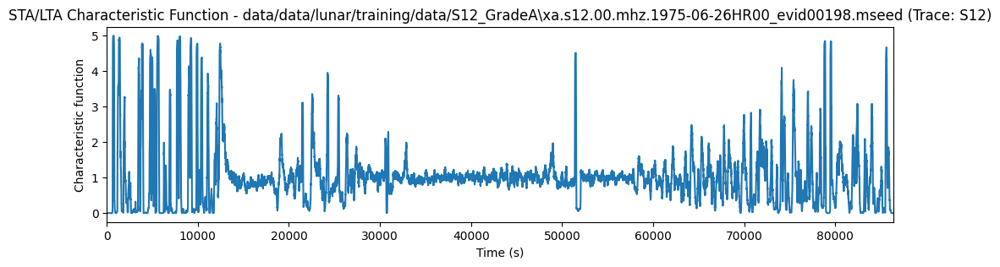

In [5]:
if not mseed_files:
    print("No .mseed files found in the specified directory.")
else:
    for file in mseed_files:
        print(f"Processing file: {file}")
        stream = obspy.read(file)

        for tr in stream:
            df = tr.stats.sampling_rate
            sta_len = 120  # seconds
            lta_len = 600  # seconds

            tr_data = tr.data
            tr_times = tr.times()
            cft = classic_sta_lta(tr_data, int(sta_len * df), int(lta_len * df))

            fig, ax = plt.subplots(1, 1, figsize=(12, 3))
            ax.plot(tr_times, cft)
            ax.set_xlim([min(tr_times), max(tr_times)])
            ax.set_xlabel('Time (s)')
            ax.set_ylabel('Characteristic function')
            ax.set_title(f"STA/LTA Characteristic Function - {file} (Trace: {tr.stats.station})")

            plt.show()


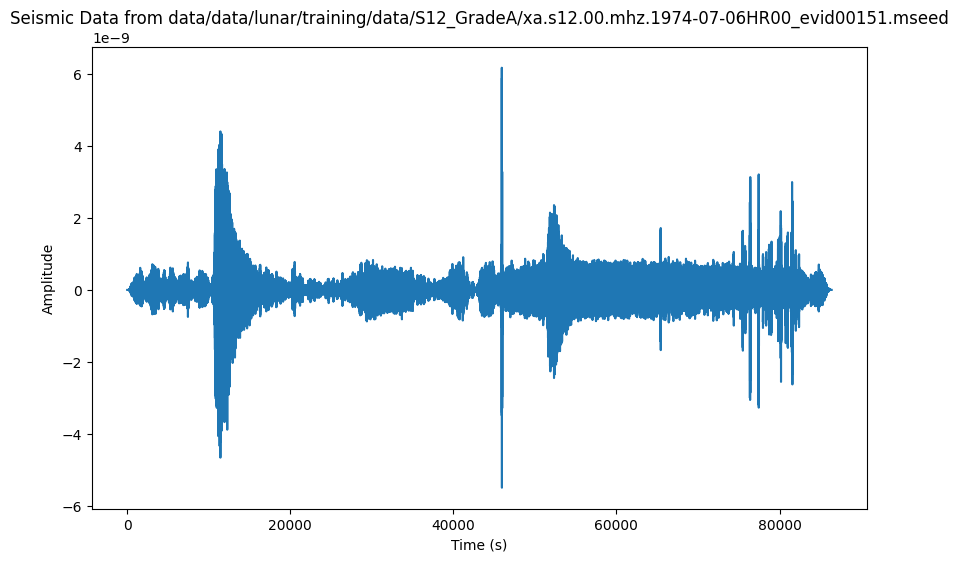

In [6]:
import obspy
import matplotlib.pyplot as plt

# Specify the path to the .mseed file
mseed_file = 'data/data/lunar/training/data/S12_GradeA/xa.s12.00.mhz.1974-07-06HR00_evid00151.mseed'  # Replace with your file path

# Read the .mseed file
stream = obspy.read(mseed_file)

# Optionally, you can access individual traces
# For example, to access the first trace:
trace = stream[0]

# Plot the seismic data
plt.figure(figsize=(10, 6))
plt.plot(trace.times(), trace.data)  # Using trace.times() for the x-axis and trace.data for the y-axis
plt.title(f"Seismic Data from {mseed_file}")
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')

# Show the plot
plt.show()


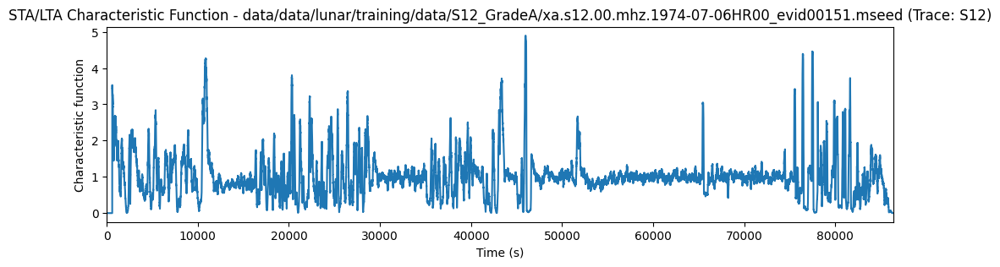

In [7]:
import obspy
import matplotlib.pyplot as plt
from obspy.signal.trigger import classic_sta_lta

# Specify the path to the .mseed file
mseed_file = 'data/data/lunar/training/data/S12_GradeA/xa.s12.00.mhz.1974-07-06HR00_evid00151.mseed' # Replace with your file path

# Read the .mseed file
stream = obspy.read(mseed_file)  # Load the .mseed file as an ObsPy Stream object

# Process each trace in the stream (usually there's only one trace, but you can process multiple if needed)
for tr in stream:
    # Sampling frequency of the trace
    df = tr.stats.sampling_rate

    # Define short-term and long-term window lengths (in seconds)
    sta_len = 120  # Short-term window length in seconds
    lta_len = 600  # Long-term window length in seconds

    # Extract the data from the trace
    tr_data = tr.data
    tr_times = tr.times()  # Get the time axis for plotting the characteristic function

    # Run ObsPy's STA/LTA to obtain a characteristic function
    cft = classic_sta_lta(tr_data, int(sta_len * df), int(lta_len * df))

    # Plot characteristic function
    fig, ax = plt.subplots(1, 1, figsize=(12, 3))
    ax.plot(tr_times, cft)
    ax.set_xlim([min(tr_times), max(tr_times)])
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Characteristic function')
    ax.set_title(f"STA/LTA Characteristic Function - {mseed_file} (Trace: {tr.stats.station})")

    # Display the plot
    plt.show()


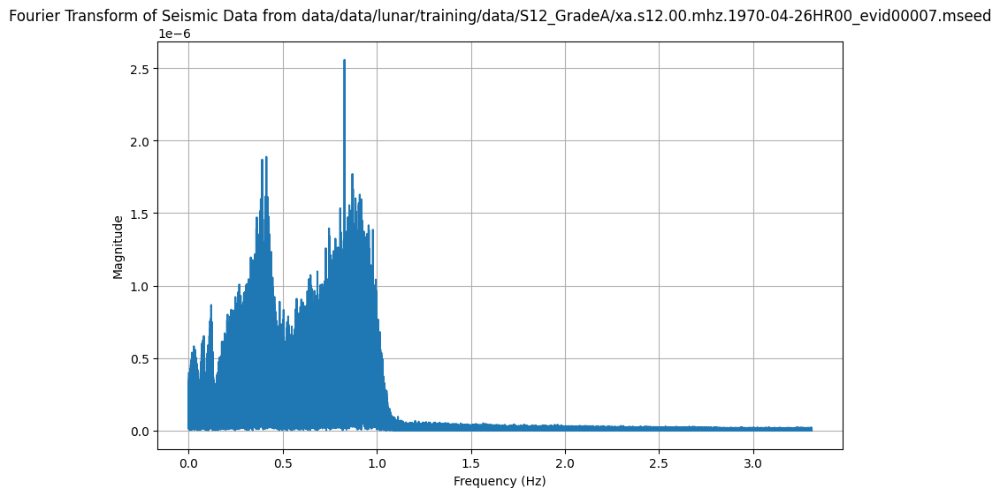

In [11]:
import obspy
import matplotlib.pyplot as plt
import numpy as np

# Specify the path to the .mseed file
mseed_file = 'data/data/lunar/training/data/S12_GradeA/xa.s12.00.mhz.1970-04-26HR00_evid00007.mseed'  # Replace with your file path

# Read the .mseed file
stream = obspy.read(mseed_file)

# Access the first trace (you can adjust if there are multiple traces)
trace = stream[0]

# Get the data and the corresponding time values
data = trace.data
time = trace.times()

# Perform the Fourier Transform (FFT)
n = len(data)
sampling_rate = trace.stats.sampling_rate  # Get the sampling rate
frequencies = np.fft.fftfreq(n, 1/sampling_rate)  # Frequency bins
fft_values = np.fft.fft(data)  # Apply FFT

# Compute the magnitude of the FFT (for plotting)
fft_magnitude = np.abs(fft_values)

# Plot the FFT result (frequency vs magnitude)
plt.figure(figsize=(10, 6))
plt.plot(frequencies[:n//2], fft_magnitude[:n//2])  # Plot only the positive frequencies
plt.title(f"Fourier Transform of Seismic Data from {mseed_file}")
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.grid(True)

# Show the plot
plt.show()




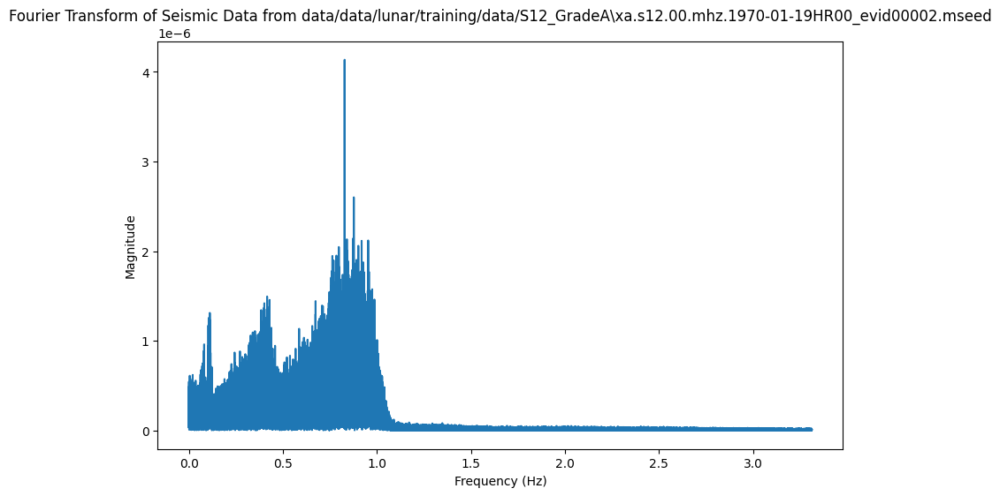

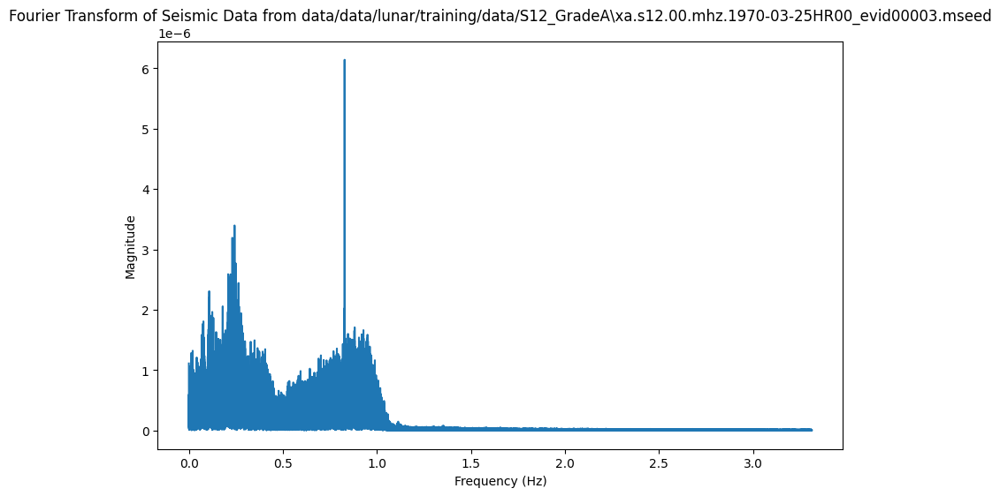

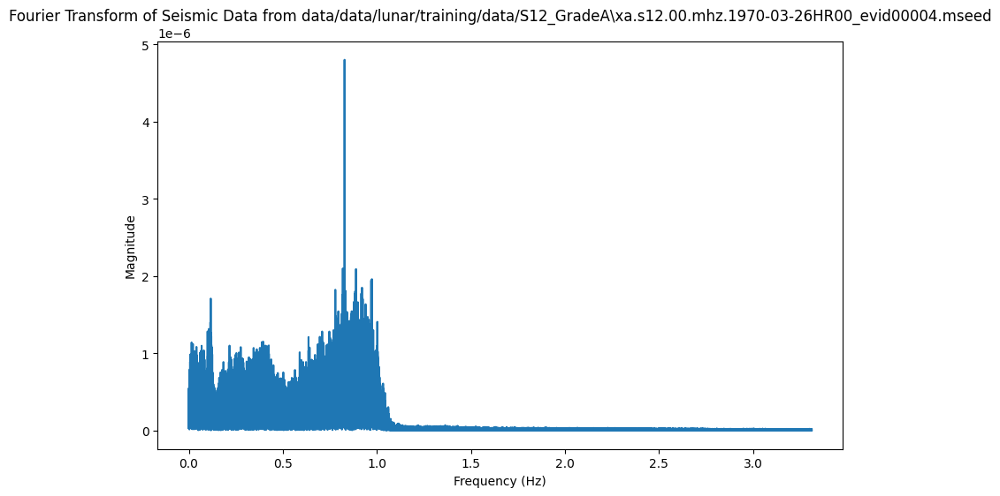

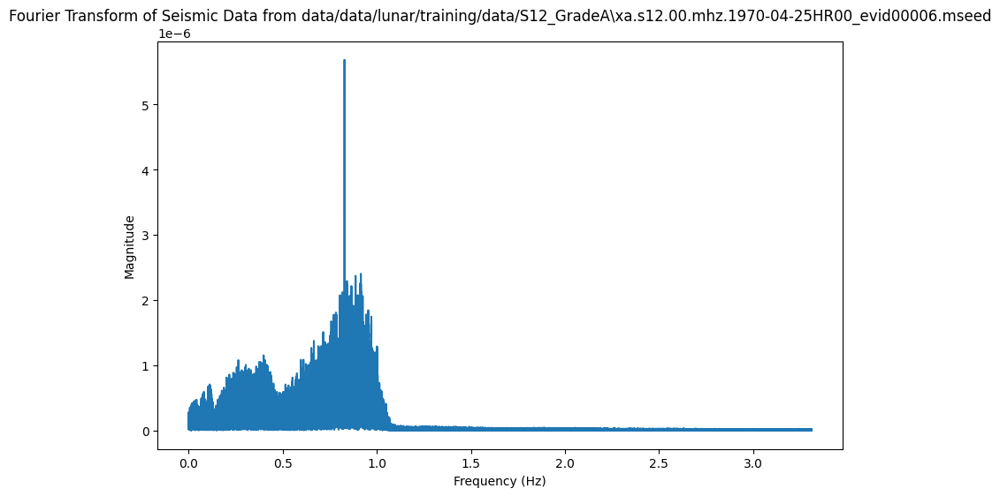

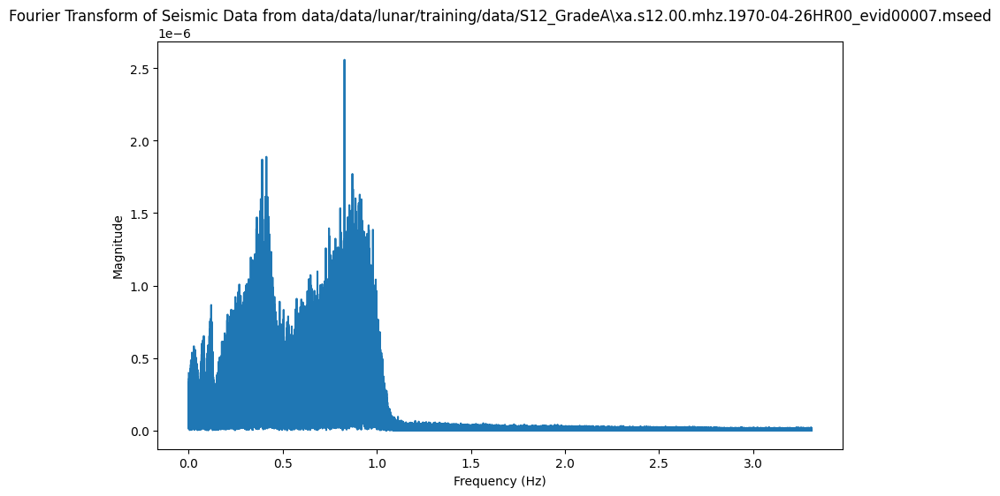

...

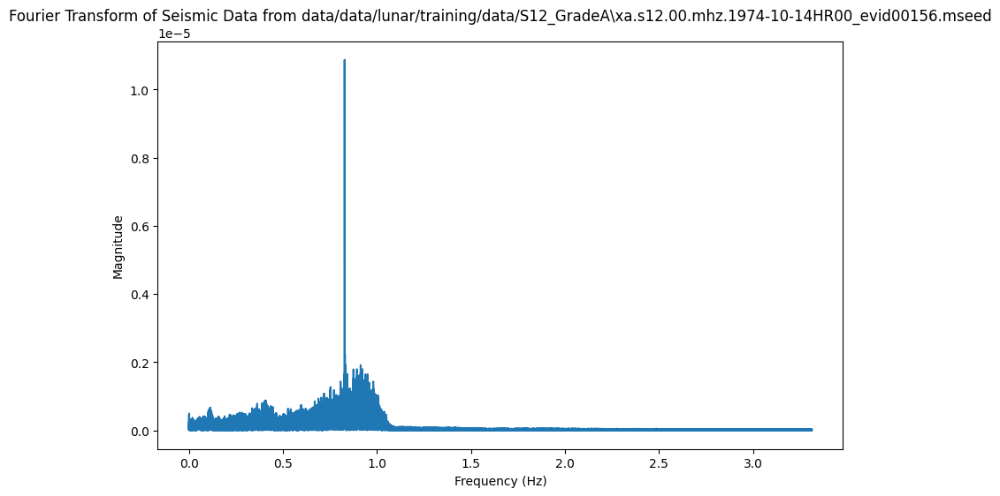

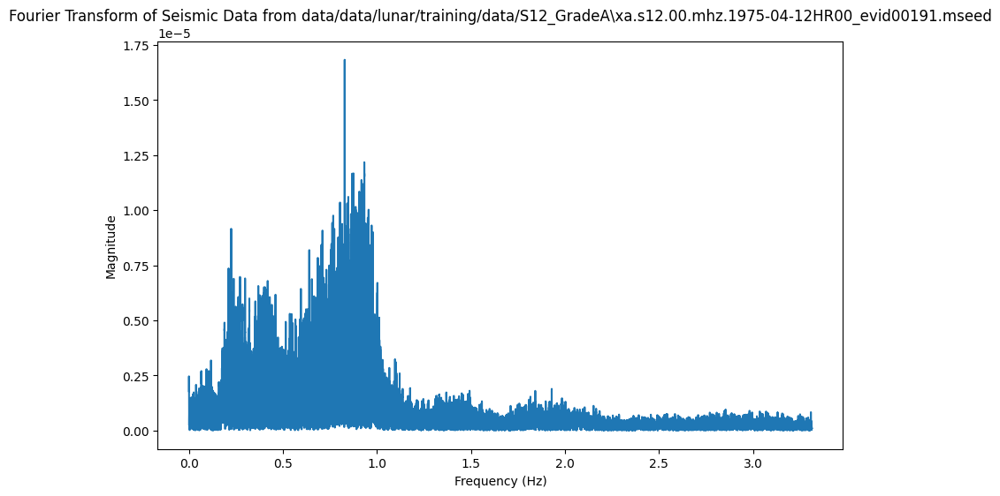

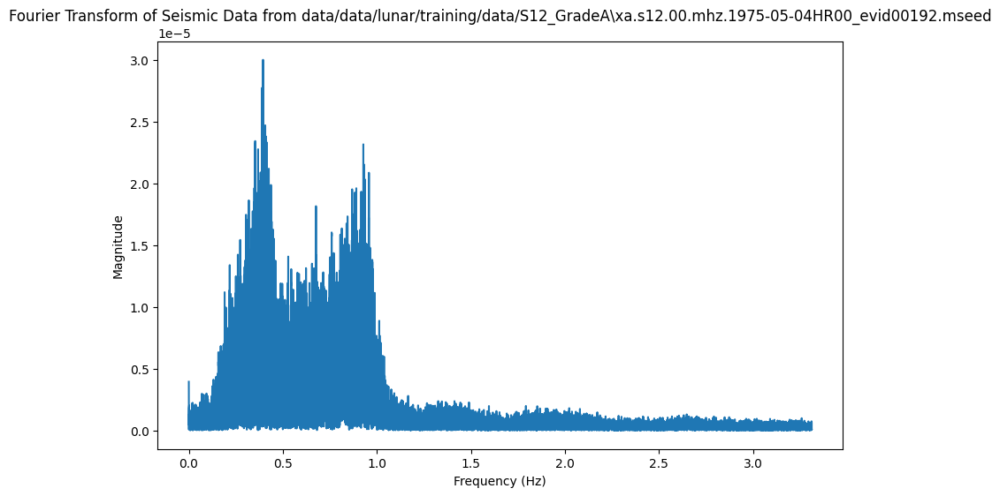

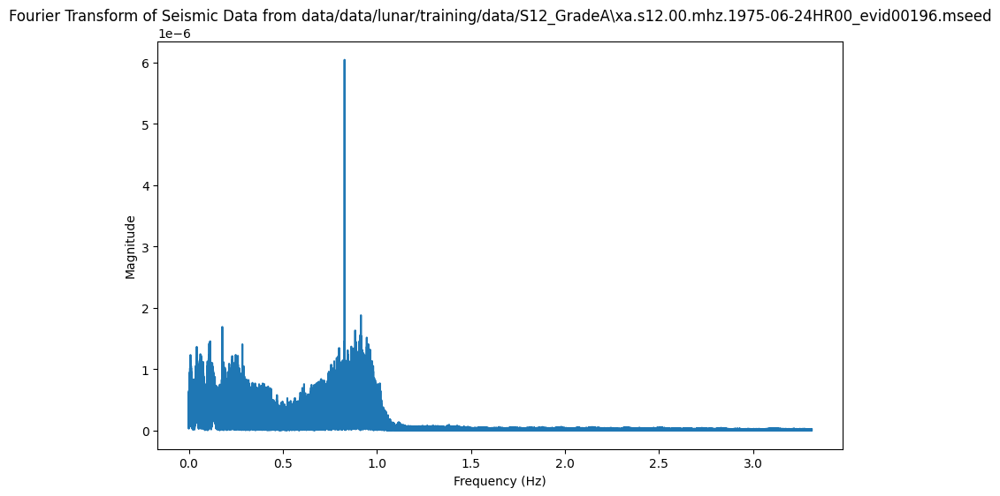

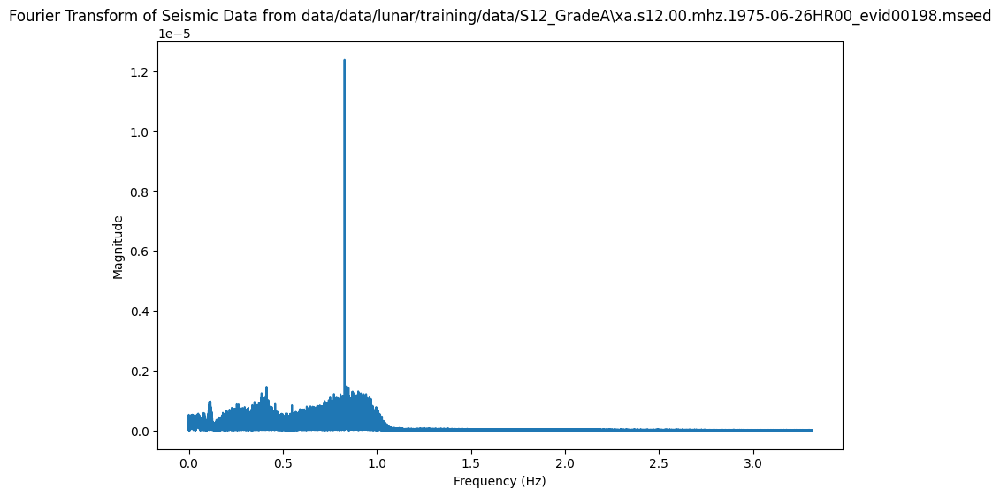

In [13]:
import obspy
import matplotlib.pyplot as plt
import numpy as np
import glob

# Specify the folder path containing the .mseed files
folder_path = 'data/data/lunar/training/data/S12_GradeA/'  # Replace with your folder path

# Get a list of all .mseed files in the folder
mseed_files = glob.glob(folder_path + '*.mseed')

# Loop through each .mseed file in the folder
for mseed_file in mseed_files:
    # Read the .mseed file
    stream = obspy.read(mseed_file)
    
    # Access the first trace (you can adjust if there are multiple traces)
    trace = stream[0]

    # Get the data and the corresponding time values
    data = trace.data
    time = trace.times()

    # Perform the Fourier Transform (FFT)
    n = len(data)
    sampling_rate = trace.stats.sampling_rate  # Get the sampling rate
    frequencies = np.fft.fftfreq(n, 1/sampling_rate)  # Frequency bins
    fft_values = np.fft.fft(data)  # Apply FFT

    # Compute the magnitude of the FFT (for plotting)
    fft_magnitude = np.abs(fft_values)

    # Plot the FFT result (frequency vs magnitude)
    plt.figure(figsize=(10, 6))
    plt.plot(frequencies[:n//2], fft_magnitude[:n//2])  # Plot only the positive frequencies
    plt.title(f"Fourier Transform of Seismic Data from {mseed_file}")
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Magnitude')
    plt.grid(False)

    # Show the plot
    plt.show()


In [30]:
import obspy
import matplotlib.pyplot as plt
import numpy as np
import glob
import os

# Specify the folder path containing the .mseed files
folder_path = 'data/data/lunar/training/data/S12_GradeA/'  # Replace with your folder path
output_folder = 'saved_plots/'  # Folder to save the plots

# Create the output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# Get a list of all .mseed files in the folder
mseed_files = glob.glob(folder_path + '*.mseed')

# Loop through each .mseed file in the folder
for mseed_file in mseed_files:
    # Read the .mseed file
    stream = obspy.read(mseed_file)
    
    # Access the first trace (you can adjust if there are multiple traces)
    trace = stream[0]

    # Get the data and the corresponding time values
    data = trace.data
    time = trace.times()

    # Perform the Fourier Transform (FFT)
    n = len(data)
    sampling_rate = trace.stats.sampling_rate  # Get the sampling rate
    frequencies = np.fft.fftfreq(n, 1/sampling_rate)  # Frequency bins
    fft_values = np.fft.fft(data)  # Apply FFT

    # Compute the magnitude of the FFT (for plotting)
    fft_magnitude = np.abs(fft_values)

    # Extract the filename from the mseed file path and remove extension
    filename = os.path.basename(mseed_file)  # Get the filename from the path
    filename_without_ext = os.path.splitext(filename)[0]  # Remove the extension
    
    # Debugging: Check what filename is being processed
    print(f"Processing file: {filename}")
    
    # Plot the FFT result (frequency vs magnitude)
    plt.figure(figsize=(10, 6))
    plt.plot(frequencies[:n//2], fft_magnitude[:n//2])  # Plot only the positive frequencies

    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Magnitude')
    plt.grid(False)

    # Save the plot as a PNG file using only the filename without extension
    plot_filename = os.path.join(output_folder, f"{filename_without_ext}.png")
    plt.savefig(plot_filename)

    # Close the plot to avoid memory overload
    plt.close()

    print(f"Saved plot for {filename} as {plot_filename}")


Processing file: xa.s12.00.mhz.1970-01-19HR00_evid00002.mseed
Saved plot for xa.s12.00.mhz.1970-01-19HR00_evid00002.mseed as saved_plots/xa.s12.00.mhz.1970-01-19HR00_evid00002.png
Processing file: xa.s12.00.mhz.1970-03-25HR00_evid00003.mseed
Saved plot for xa.s12.00.mhz.1970-03-25HR00_evid00003.mseed as saved_plots/xa.s12.00.mhz.1970-03-25HR00_evid00003.png
Processing file: xa.s12.00.mhz.1970-03-26HR00_evid00004.mseed
Saved plot for xa.s12.00.mhz.1970-03-26HR00_evid00004.mseed as saved_plots/xa.s12.00.mhz.1970-03-26HR00_evid00004.png
Processing file: xa.s12.00.mhz.1970-04-25HR00_evid00006.mseed
Saved plot for xa.s12.00.mhz.1970-04-25HR00_evid00006.mseed as saved_plots/xa.s12.00.mhz.1970-04-25HR00_evid00006.png
Processing file: xa.s12.00.mhz.1970-04-26HR00_evid00007.mseed
Saved plot for xa.s12.00.mhz.1970-04-26HR00_evid00007.mseed as saved_plots/xa.s12.00.mhz.1970-04-26HR00_evid00007.png
Processing file: xa.s12.00.mhz.1970-06-15HR00_evid00008.mseed
Saved plot for xa.s12.00.mhz.1970-06-1

In [31]:
import os

# Directory containing the files
directory_path = "saved_plots"

# Loop through each file in the directory
for file_name in os.listdir(directory_path):
    # Check if the file name contains 'H' or 'R' and replace them with 'h' and 'r'
    if 'H' in file_name or 'R' in file_name:
        new_file_name = file_name.replace('H', 'h').replace('R', 'r')
        old_file_path = os.path.join(directory_path, file_name)
        new_file_path = os.path.join(directory_path, new_file_name)

        # Rename the file
        os.rename(old_file_path, new_file_path)

print("Files have been renamed successfully.")

Files have been renamed successfully.


In [32]:
import os
import pandas as pd
import matplotlib.pyplot as plt

# Define the directory containing spectrograms
spectrogram_dir = 'saved_plots'

# Load the catalog
catalog = pd.read_csv('data/data/lunar/training/catalogs/apollo12_catalog_GradeA_final.csv')

# Ensure catalog filenames have no extension and normalize (lowercase and strip)
catalog['file'] = catalog['filename'].str.strip().str.lower()  # Normalize catalog filenames (lowercase and remove spaces)

# List all spectrogram files in the directory and normalize filenames
spectrogram_files = [os.path.splitext(f)[0].strip().lower() for f in os.listdir(spectrogram_dir) if f.endswith('.png')]

# Create a mapping of filenames to labels
labels = []
for spectrogram in spectrogram_files:
    label_row = catalog[catalog['file'] == spectrogram]  # Match spectrogram filename to catalog
    if not label_row.empty:
        label = label_row['mq_type'].values[0]  # Replace with the correct column name for labels
        labels.append({'file': spectrogram + '.png', 'label': label})  # Add the extension back for the spectrogram file
    else:
        print(f"No label found for {spectrogram}")

# Save the labels to a CSV in Google Drive or any specific directory
output_csv_path = 'labeled_spectrograms.csv'
labels_df = pd.DataFrame(labels)
labels_df.to_csv(output_csv_path, index=False)

print(f"Labeling complete. Labeled spectrograms saved to: {output_csv_path}")

# Assuming you have a function to load spectrogram data
def load_spectrogram(filename):
    # ... your code to load spectrogram data ...
    return spectrogram_data

# Function to plot the spectrogram with a white background and no grid
def plot_spectrogram(spectrogram_data, filename):
    plt.figure(figsize=(10, 4))
    plt.imshow(spectrogram_data, aspect='auto', cmap='viridis')
    plt.axis('off')  # Turn off axes and grid
    plt.savefig(filename, bbox_inches='tight', pad_inches=0)  # Save plot with tight layout and no padding
    plt.close()

# Iterate over spectrogram files and plot them
for label in labels:
    spectrogram_file = label['file']
    spectrogram_data = load_spectrogram(spectrogram_file)
    plot_spectrogram(spectrogram_data, spectrogram_file)

No label found for xa.s12.00.mhz.1971-04-13hr02_evid00029
Labeling complete. Labeled spectrograms saved to: labeled_spectrograms.csv


## one dense without dropout

In [33]:
import os
import pandas as pd
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing import image

# Load the labeled spectrograms CSV file
labels_df = pd.read_csv('labeled_spectrograms.csv')

# Set directory where your spectrograms are stored
spectrogram_dir = 'saved_plots/'

# Prepare your data and labels
spectrograms = []
labels = []

for _, row in labels_df.iterrows():
    img_path = os.path.join(spectrogram_dir, row['file'])
    
    # Load and preprocess the image
    img = image.load_img(img_path, target_size=(224, 224))  # Resize the image to 224x224
    img_array = image.img_to_array(img) / 255.0  # Normalize pixel values to [0,1]
    spectrograms.append(img_array)
    
    # Append the label (assuming it's a classification task)
    labels.append(row['label'])

# Convert to numpy arrays
X = np.array(spectrograms)
y = np.array(labels)

# If your labels are categorical, encode them
# Example for categorical (use to_categorical for multi-class classification)
y_encoded = pd.get_dummies(y).values  # One-hot encode labels if needed

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

# CNN model architecture
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)),
    MaxPooling2D(2, 2),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),
    Flatten(),
    Dense(128, activation='relu'),
    # Dropout(0.5),
    # Dense(128, activation='relu'),
    # Dense(128, activation='relu'),
    Dense(y_encoded.shape[1], activation='softmax')  # Number of output classes
])

# Compile the model
model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model (without data augmentation)
model.fit(X_train, y_train, batch_size=8, epochs=20, validation_data=(X_test, y_test))

# Save the model for later use
model.save('seismic_wave_cnn_model.h5')

# Evaluate the model on test data
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {accuracy * 100:.2f}%")


Epoch 1/20


c:\Users\jana2\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 3s 233ms/step - accuracy: 0.7310 - loss: 2.2827 - val_accuracy: 0.8667 - val_loss: 0.5033
Epoch 2/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 208ms/step - accuracy: 0.8327 - loss: 0.6934 - val_accuracy: 0.8667 - val_loss: 0.4970
Epoch 3/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 206ms/step - accuracy: 0.8707 - loss: 0.5403 - val_accuracy: 0.8667 - val_loss: 0.4488
Epoch 4/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 205ms/step - accuracy: 0.8709 - loss: 0.4828 - val_accuracy: 0.8667 - val_loss: 0.4883
Epoch 5/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 211ms/step - accuracy: 0.8068 - loss: 0.5955 - val_accuracy: 0.8667 - val_loss: 0.4315
Epoch 6/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 217ms/step - accuracy: 0.8192 - loss: 0.5610 - val_accuracy: 0.8667 - val_loss: 0.4469
Epoch 7/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 211ms/step - accuracy: 0.8156 - loss: 0.6199 - val_accuracy: 0.8667 - val_loss: 0.4704
Epoch 8/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 209ms/step - accuracy: 0.8040 - loss: 0.5927 - val_accuracy: 0.8667 - val_loss: 0.4524
Epo

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - accuracy: 0.8667 - loss: 0.4555
Test Accuracy: 86.67%


## more than dense without dropout 

In [35]:
import os
import pandas as pd
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing import image

# Load the labeled spectrograms CSV file
labels_df = pd.read_csv('labeled_spectrograms.csv')

# Set directory where your spectrograms are stored
spectrogram_dir = 'saved_plots/'

# Prepare your data and labels
spectrograms = []
labels = []

for _, row in labels_df.iterrows():
    img_path = os.path.join(spectrogram_dir, row['file'])
    
    # Load and preprocess the image
    img = image.load_img(img_path, target_size=(224, 224))  # Resize the image to 224x224
    img_array = image.img_to_array(img) / 255.0  # Normalize pixel values to [0,1]
    spectrograms.append(img_array)
    
    # Append the label (assuming it's a classification task)
    labels.append(row['label'])

# Convert to numpy arrays
X = np.array(spectrograms)
y = np.array(labels)

# If your labels are categorical, encode them
# Example for categorical (use to_categorical for multi-class classification)
y_encoded = pd.get_dummies(y).values  # One-hot encode labels if needed

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

# CNN model architecture
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)),
    MaxPooling2D(2, 2),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),
    Flatten(),
    Dense(128, activation='relu'),
    # Dropout(0.5),
    Dense(128, activation='relu'),
    Dense(128, activation='relu'),
    Dense(y_encoded.shape[1], activation='softmax')  # Number of output classes
])

# Compile the model
model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model (without data augmentation)
model.fit(X_train, y_train, batch_size=8, epochs=20, validation_data=(X_test, y_test))

# Save the model for later use
model.save('seismic_wave_cnn_model.h5')

# Evaluate the model on test data
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {accuracy * 100:.2f}%")


Epoch 1/20


c:\Users\jana2\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 4s 235ms/step - accuracy: 0.8295 - loss: 1.0217 - val_accuracy: 0.8667 - val_loss: 0.5811
Epoch 2/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 210ms/step - accuracy: 0.8281 - loss: 0.7410 - val_accuracy: 0.8667 - val_loss: 0.5266
Epoch 3/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 211ms/step - accuracy: 0.8605 - loss: 0.5692 - val_accuracy: 0.8667 - val_loss: 0.4586
Epoch 4/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 203ms/step - accuracy: 0.8435 - loss: 0.5358 - val_accuracy: 0.8667 - val_loss: 0.4372
Epoch 5/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 226ms/step - accuracy: 0.8054 - loss: 0.6411 - val_accuracy: 0.8667 - val_loss: 0.4224
Epoch 6/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 208ms/step - accuracy: 0.8353 - loss: 0.5831 - val_accuracy: 0.8667 - val_loss: 0.4615
Epoch 7/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 227ms/step - accuracy: 0.8284 - loss: 0.5503 - val_accuracy: 0.8667 - val_loss: 0.4451
Epoch 8/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 219ms/step - accuracy: 0.8235 - loss: 0.6004 - val_accuracy: 0.8667 - val_loss: 0.4570
Epo

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.8667 - loss: 0.9853
Test Accuracy: 86.67%


## 3 dense with dropout of each

In [36]:
import os
import pandas as pd
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing import image

# Load the labeled spectrograms CSV file
labels_df = pd.read_csv('labeled_spectrograms.csv')

# Set directory where your spectrograms are stored
spectrogram_dir = 'saved_plots/'

# Prepare your data and labels
spectrograms = []
labels = []

for _, row in labels_df.iterrows():
    img_path = os.path.join(spectrogram_dir, row['file'])
    
    # Load and preprocess the image
    img = image.load_img(img_path, target_size=(224, 224))  # Resize the image to 224x224
    img_array = image.img_to_array(img) / 255.0  # Normalize pixel values to [0,1]
    spectrograms.append(img_array)
    
    # Append the label (assuming it's a classification task)
    labels.append(row['label'])

# Convert to numpy arrays
X = np.array(spectrograms)
y = np.array(labels)

# If your labels are categorical, encode them
# Example for categorical (use to_categorical for multi-class classification)
y_encoded = pd.get_dummies(y).values  # One-hot encode labels if needed

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

# CNN model architecture
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)),
    MaxPooling2D(2, 2),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),
    Flatten(),
    Dense(128, activation='relu'),
     Dropout(0.5),
     Dense(128, activation='relu'),
     Dropout(0.5),
     Dense(128, activation='relu'),
    Dense(y_encoded.shape[1], activation='softmax')  # Number of output classes
])

# Compile the model
model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model (without data augmentation)
model.fit(X_train, y_train, batch_size=8, epochs=20, validation_data=(X_test, y_test))

# Save the model for later use
model.save('seismic_wave_cnn_model.h5')

# Evaluate the model on test data
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {accuracy * 100:.2f}%")


Epoch 1/20


c:\Users\jana2\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 4s 228ms/step - accuracy: 0.5252 - loss: 1.0002 - val_accuracy: 0.8667 - val_loss: 0.7444
Epoch 2/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 205ms/step - accuracy: 0.8579 - loss: 0.8946 - val_accuracy: 0.8667 - val_loss: 0.4453
Epoch 3/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 209ms/step - accuracy: 0.8403 - loss: 0.6561 - val_accuracy: 0.8667 - val_loss: 0.4508
Epoch 4/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 205ms/step - accuracy: 0.8173 - loss: 0.5768 - val_accuracy: 0.8667 - val_loss: 0.4439
Epoch 5/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 204ms/step - accuracy: 0.8828 - loss: 0.4309 - val_accuracy: 0.8667 - val_loss: 0.4986
Epoch 6/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 204ms/step - accuracy: 0.8060 - loss: 0.6111 - val_accuracy: 0.8667 - val_loss: 0.4318
Epoch 7/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 207ms/step - accuracy: 0.8419 - loss: 0.5224 - val_accuracy: 0.8667 - val_loss: 0.4931
Epoch 8/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 203ms/step - accuracy: 0.8312 - loss: 0.5502 - val_accuracy: 0.8667 - val_loss: 0.4391
Epo

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.8667 - loss: 0.5257
Test Accuracy: 86.67%


In [42]:
import os
import pandas as pd
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing import image

# Load the labeled spectrograms CSV file
labels_df = pd.read_csv('labeled_spectrograms.csv')

# Set directory where your spectrograms are stored
spectrogram_dir = 'saved_plots/'

# Prepare your data and labels
spectrograms = []
labels = []

for _, row in labels_df.iterrows():
    img_path = os.path.join(spectrogram_dir, row['file'])
    
    # Load and preprocess the image
    img = image.load_img(img_path, target_size=(224, 224))  # Resize the image to 224x224
    img_array = image.img_to_array(img) / 255.0  # Normalize pixel values to [0,1]
    spectrograms.append(img_array)
    
    # Append the label (assuming it's a classification task)
    labels.append(row['label'])

# Convert to numpy arrays
X = np.array(spectrograms)
y = np.array(labels)

# If your labels are categorical, encode them
# Example for categorical (use to_categorical for multi-class classification)
y_encoded = pd.get_dummies(y).values  # One-hot encode labels if needed

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

# CNN model architecture
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)),
    MaxPooling2D(2, 2),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),
    Flatten(),
    Dense(100, activation='relu'),
   
    Dense(y_encoded.shape[1], activation='softmax')  # Number of output classes
])

# Compile the model
model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model (without data augmentation)
model.fit(X_train, y_train, batch_size=8, epochs=25, validation_data=(X_test, y_test))

# Save the model for later use
model.save('seismic_wave_cnn_model.h5')

# Evaluate the model on test data
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {accuracy * 100:.2f}%")


Epoch 1/25


c:\Users\jana2\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


8/8 ━━━━━━━━━━━━━━━━━━━━ 3s 218ms/step - accuracy: 0.5875 - loss: 1.1200 - val_accuracy: 0.8667 - val_loss: 0.5257
Epoch 2/25
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 185ms/step - accuracy: 0.7992 - loss: 0.6534 - val_accuracy: 0.8667 - val_loss: 0.4333
Epoch 3/25
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 191ms/step - accuracy: 0.8854 - loss: 0.4485 - val_accuracy: 0.8667 - val_loss: 0.5433
Epoch 4/25
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 188ms/step - accuracy: 0.7653 - loss: 0.7525 - val_accuracy: 0.8667 - val_loss: 0.5024
Epoch 5/25
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 194ms/step - accuracy: 0.8375 - loss: 0.6844 - val_accuracy: 0.8667 - val_loss: 0.4505
Epoch 6/25
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 193ms/step - accuracy: 0.7811 - loss: 0.6758 - val_accuracy: 0.8667 - val_loss: 0.4598
Epoch 7/25
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 188ms/step - accuracy: 0.8322 - loss: 0.6170 - val_accuracy: 0.8667 - val_loss: 0.4615
Epoch 8/25
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 193ms/step - accuracy: 0.8530 - loss: 0.5074 - val_accuracy: 0.8667 - val_loss: 0.4523
Epo

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.8667 - loss: 1.1499
Test Accuracy: 86.67%


## predict on the model data lunar first file

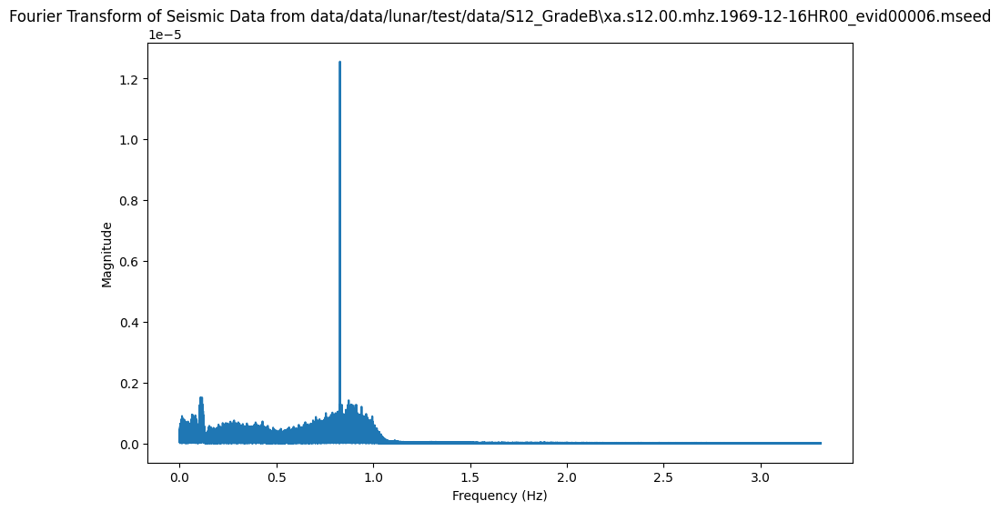

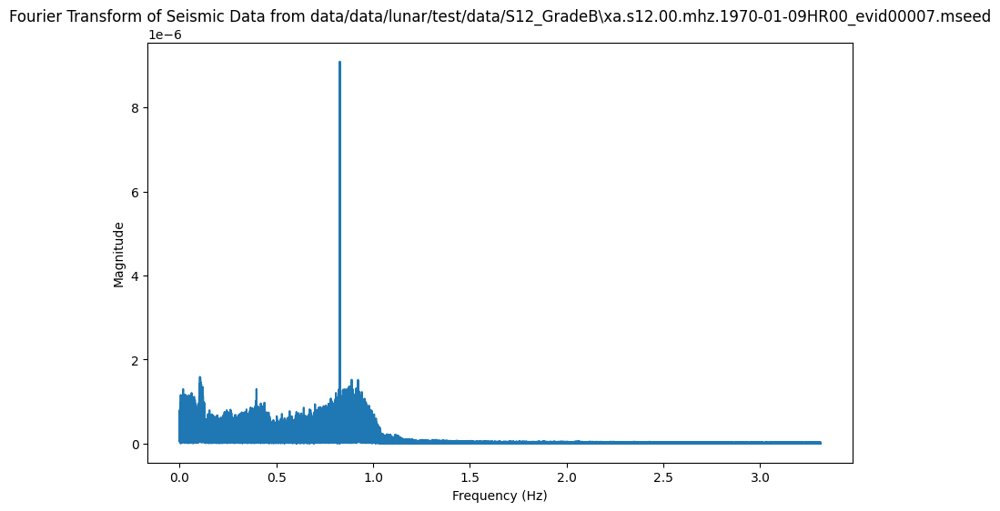

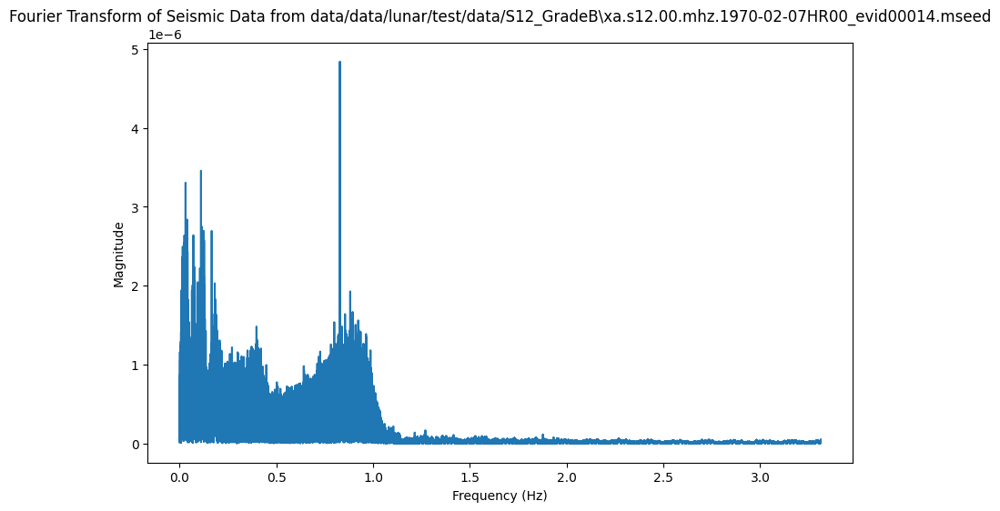

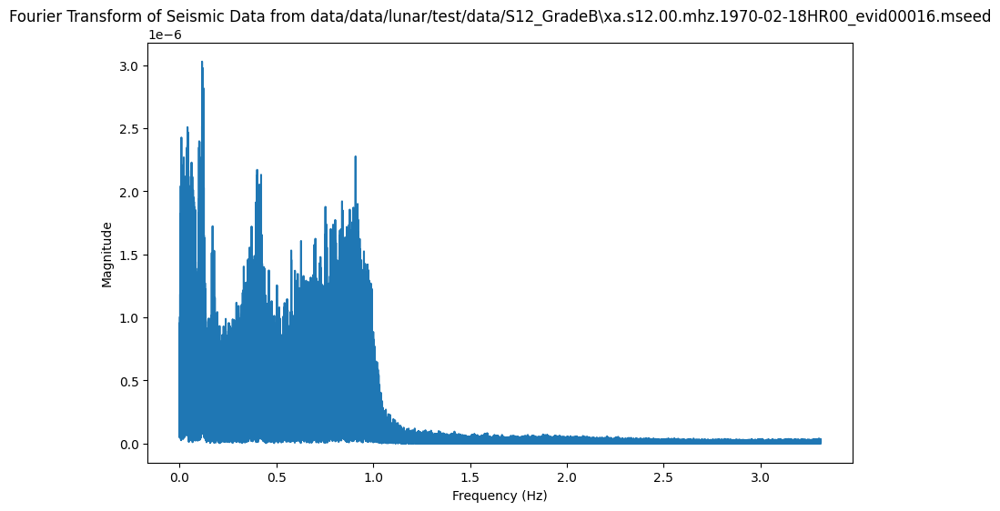

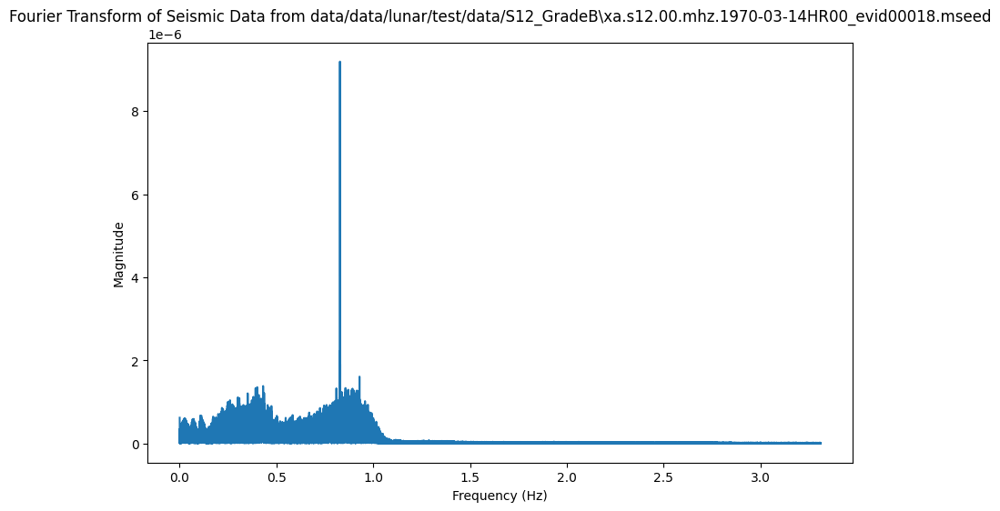

...

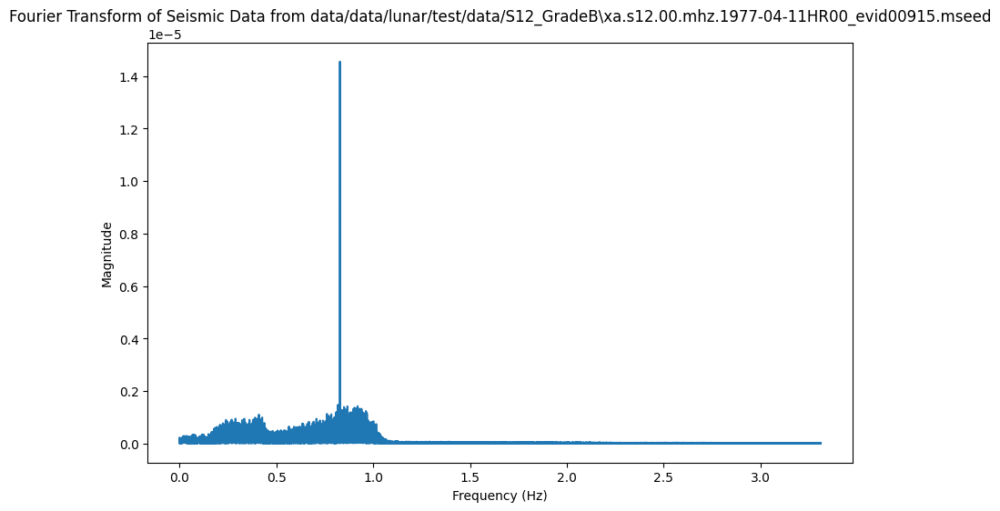

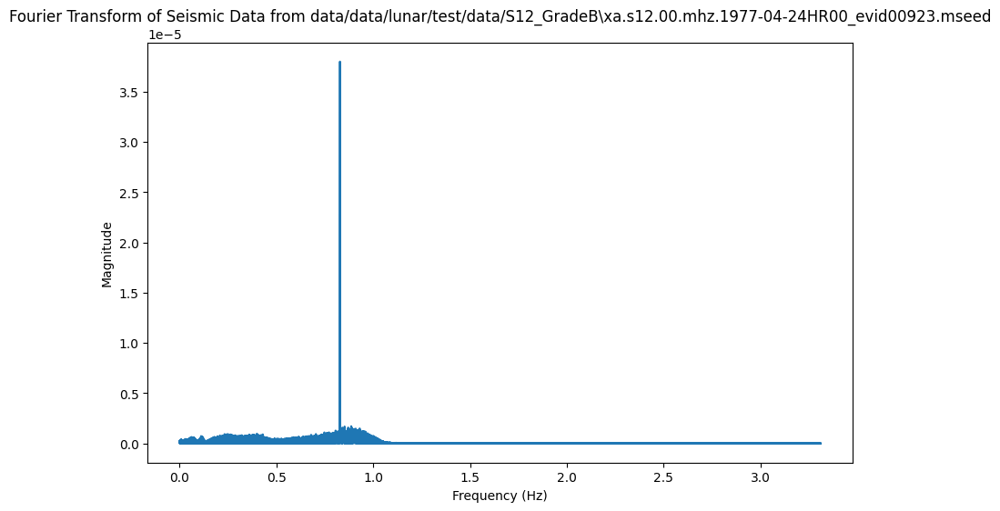

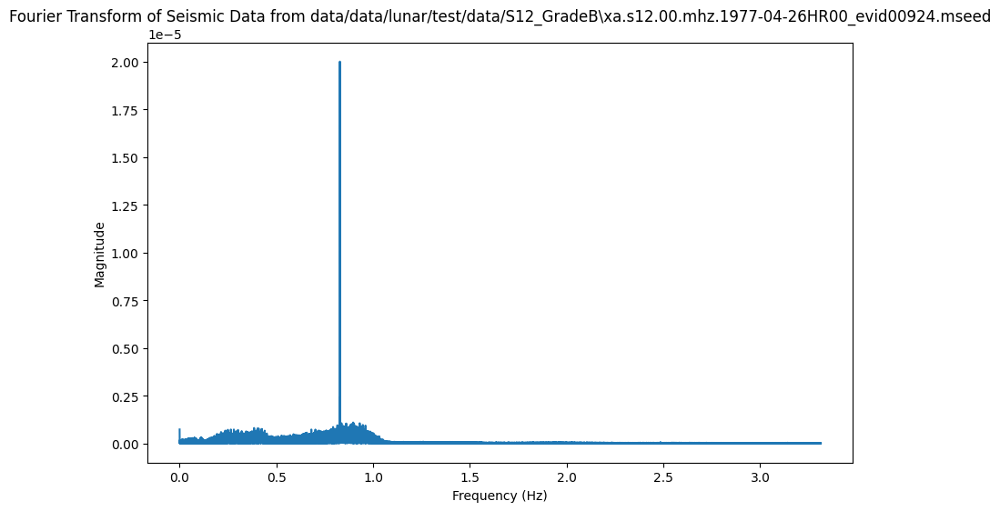

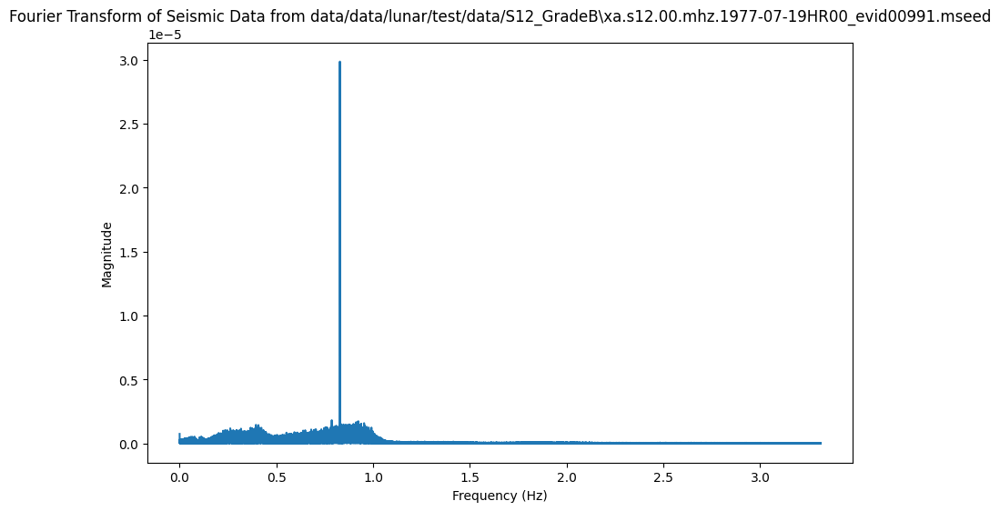

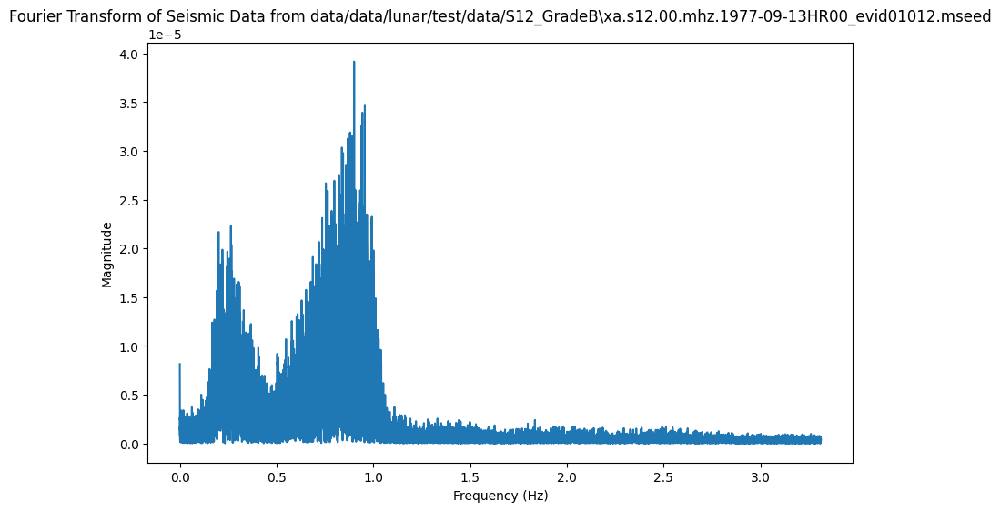

In [45]:
import obspy
import matplotlib.pyplot as plt
import numpy as np
import glob

# Specify the folder path containing the .mseed files
folder_path = 'data/data/lunar/test/data/S12_GradeB/'  # Replace with your folder path

# Get a list of all .mseed files in the folder
mseed_files = glob.glob(folder_path + '*.mseed')

# Loop through each .mseed file in the folder
for mseed_file in mseed_files:
    # Read the .mseed file
    stream = obspy.read(mseed_file)
    
    # Access the first trace (you can adjust if there are multiple traces)
    trace = stream[0]

    # Get the data and the corresponding time values
    data = trace.data
    time = trace.times()

    # Perform the Fourier Transform (FFT)
    n = len(data)
    sampling_rate = trace.stats.sampling_rate  # Get the sampling rate
    frequencies = np.fft.fftfreq(n, 1/sampling_rate)  # Frequency bins
    fft_values = np.fft.fft(data)  # Apply FFT

    # Compute the magnitude of the FFT (for plotting)
    fft_magnitude = np.abs(fft_values)

    # Plot the FFT result (frequency vs magnitude)
    plt.figure(figsize=(10, 6))
    plt.plot(frequencies[:n//2], fft_magnitude[:n//2])  # Plot only the positive frequencies
    plt.title(f"Fourier Transform of Seismic Data from {mseed_file}")
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Magnitude')
    plt.grid(False)

    # Show the plot
    plt.show()


In [46]:
import obspy
import matplotlib.pyplot as plt
import numpy as np
import glob
import os

# Specify the folder path containing the .mseed files
folder_path = 'data/data/lunar/test/data/S12_GradeB/'  # Replace with your folder path
output_folder = 'saved_plots_test/'  # Folder to save the plots

# Create the output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# Get a list of all .mseed files in the folder
mseed_files = glob.glob(folder_path + '*.mseed')

# Loop through each .mseed file in the folder
for mseed_file in mseed_files:
    # Read the .mseed file
    stream = obspy.read(mseed_file)
    
    # Access the first trace (you can adjust if there are multiple traces)
    trace = stream[0]

    # Get the data and the corresponding time values
    data = trace.data
    time = trace.times()

    # Perform the Fourier Transform (FFT)
    n = len(data)
    sampling_rate = trace.stats.sampling_rate  # Get the sampling rate
    frequencies = np.fft.fftfreq(n, 1/sampling_rate)  # Frequency bins
    fft_values = np.fft.fft(data)  # Apply FFT

    # Compute the magnitude of the FFT (for plotting)
    fft_magnitude = np.abs(fft_values)

    # Extract the filename from the mseed file path and remove extension
    filename = os.path.basename(mseed_file)  # Get the filename from the path
    filename_without_ext = os.path.splitext(filename)[0]  # Remove the extension
    
    # Debugging: Check what filename is being processed
    print(f"Processing file: {filename}")
    
    # Plot the FFT result (frequency vs magnitude)
    plt.figure(figsize=(10, 6))
    plt.plot(frequencies[:n//2], fft_magnitude[:n//2])  # Plot only the positive frequencies

    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Magnitude')
    plt.grid(False)

    # Save the plot as a PNG file using only the filename without extension
    plot_filename = os.path.join(output_folder, f"{filename_without_ext}.png")
    plt.savefig(plot_filename)

    # Close the plot to avoid memory overload
    plt.close()

    print(f"Saved plot for {filename} as {plot_filename}")


Processing file: xa.s12.00.mhz.1969-12-16HR00_evid00006.mseed
Saved plot for xa.s12.00.mhz.1969-12-16HR00_evid00006.mseed as saved_plots_test/xa.s12.00.mhz.1969-12-16HR00_evid00006.png
Processing file: xa.s12.00.mhz.1970-01-09HR00_evid00007.mseed
Saved plot for xa.s12.00.mhz.1970-01-09HR00_evid00007.mseed as saved_plots_test/xa.s12.00.mhz.1970-01-09HR00_evid00007.png
Processing file: xa.s12.00.mhz.1970-02-07HR00_evid00014.mseed
Saved plot for xa.s12.00.mhz.1970-02-07HR00_evid00014.mseed as saved_plots_test/xa.s12.00.mhz.1970-02-07HR00_evid00014.png
Processing file: xa.s12.00.mhz.1970-02-18HR00_evid00016.mseed
Saved plot for xa.s12.00.mhz.1970-02-18HR00_evid00016.mseed as saved_plots_test/xa.s12.00.mhz.1970-02-18HR00_evid00016.png
Processing file: xa.s12.00.mhz.1970-03-14HR00_evid00018.mseed
Saved plot for xa.s12.00.mhz.1970-03-14HR00_evid00018.mseed as saved_plots_test/xa.s12.00.mhz.1970-03-14HR00_evid00018.png
Processing file: xa.s12.00.mhz.1970-03-30HR00_evid00020.mseed
Saved plot fo

In [47]:
import os

# Directory containing the files
directory_path = "saved_plots"

# Loop through each file in the directory
for file_name in os.listdir(directory_path):
    # Check if the file name contains 'H' or 'R' and replace them with 'h' and 'r'
    if 'H' in file_name or 'R' in file_name:
        new_file_name = file_name.replace('H', 'h').replace('R', 'r')
        old_file_path = os.path.join(directory_path, file_name)
        new_file_path = os.path.join(directory_path, new_file_name)

        # Rename the file
        os.rename(old_file_path, new_file_path)

print("Files have been renamed successfully.")

Files have been renamed successfully.
